# Diamond EP Grouping by Resolution Limit - Top features per resolution


In this notebook we look into the feature importances for each resolution limits. A random forest model has already been fitted on every dataset (resolution cutoff) using the Diamond computer cluster. As such, we only have to import the results and analyse the data.


## Method 1: Figure per HR

We'll first plot a surface plot of the feature importances as a function of LR, for a single HR limit.

This first code block sets the type of plot to be made (2D heatmap or 3D surface plot).

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

# options are "heatmap" (default) or "surface"
plot_kind = "heatmap"

DIALS


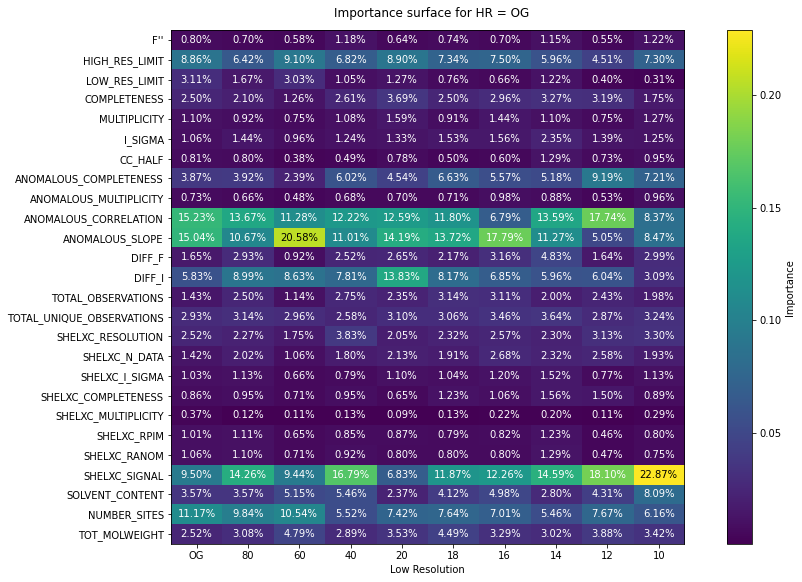

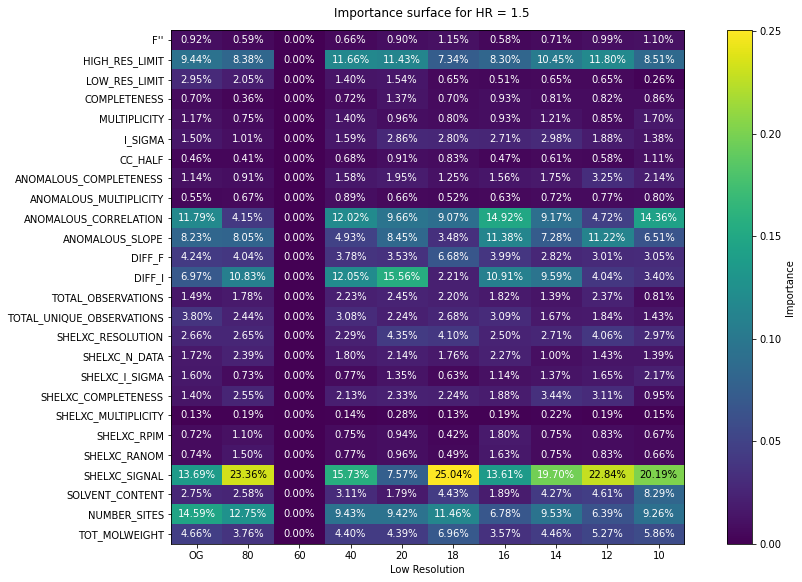

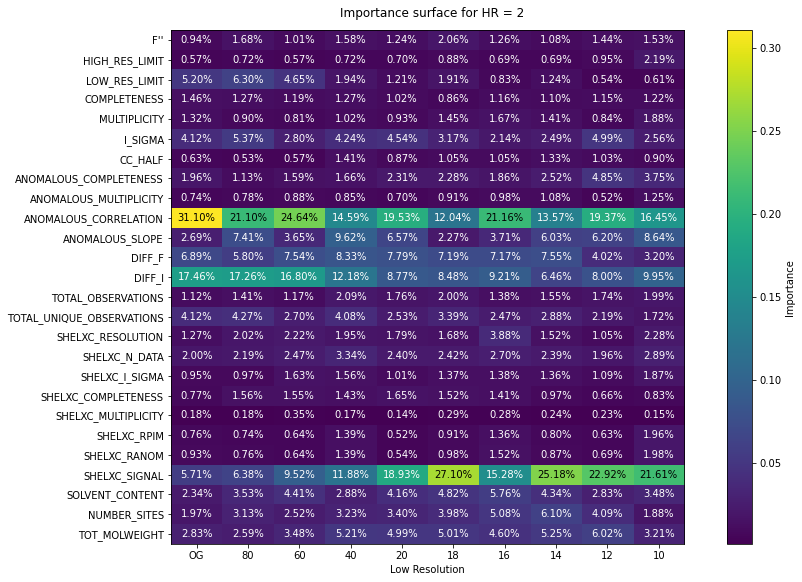

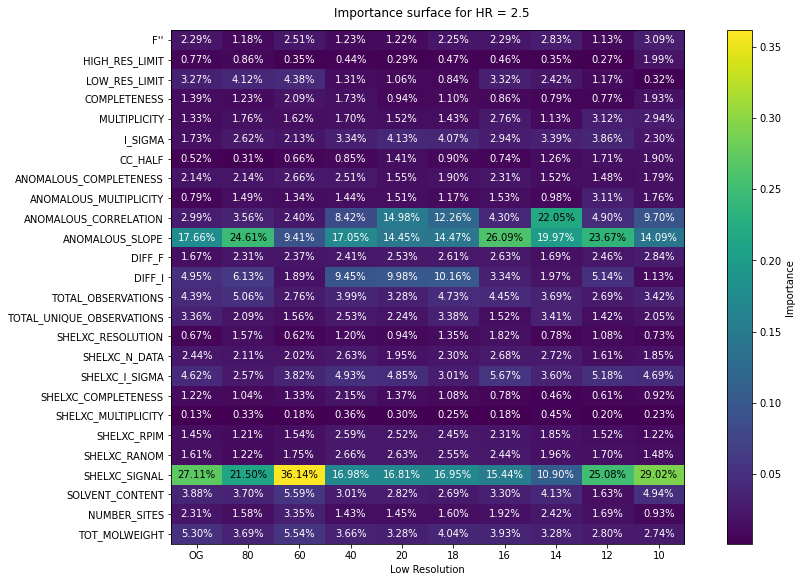

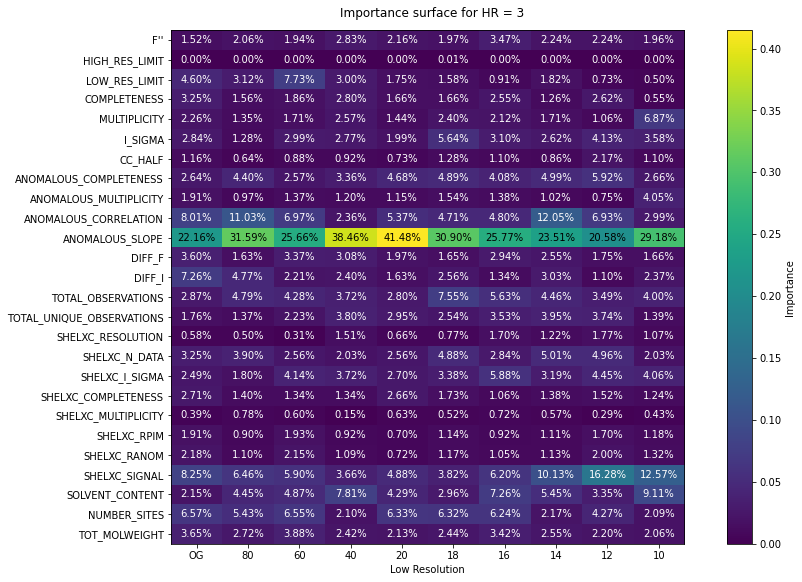

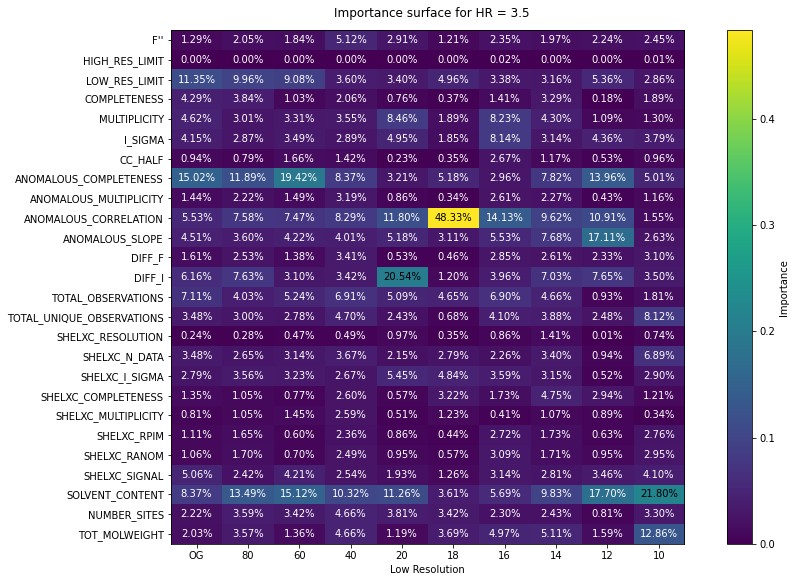

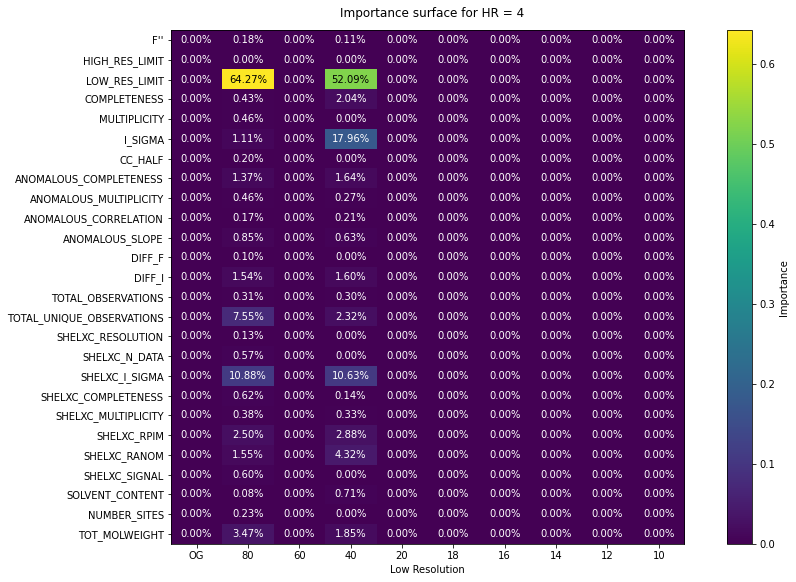

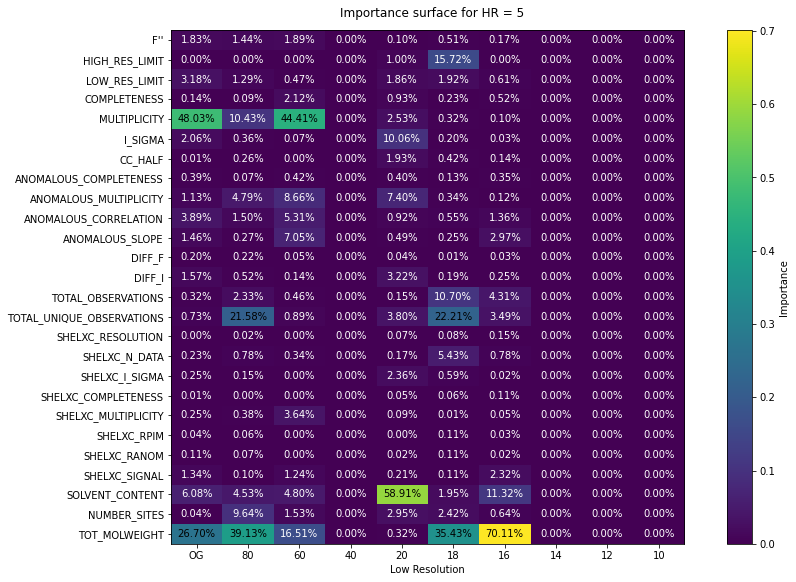

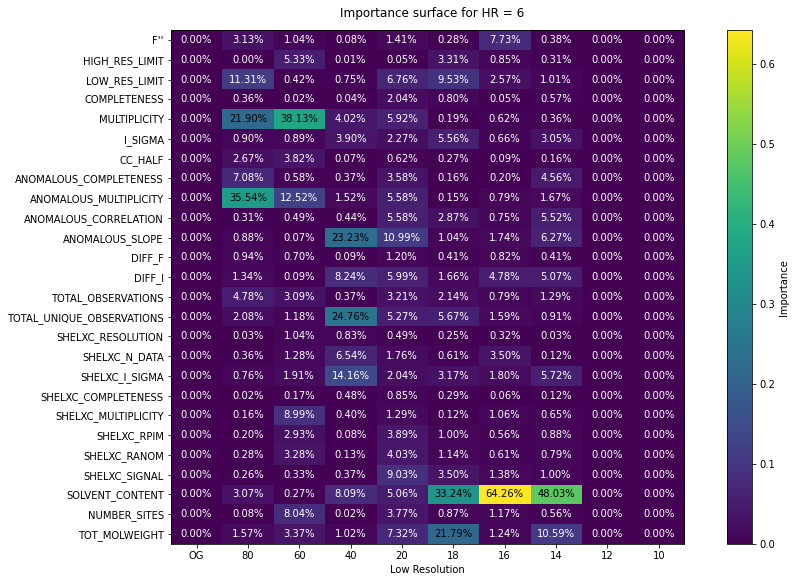

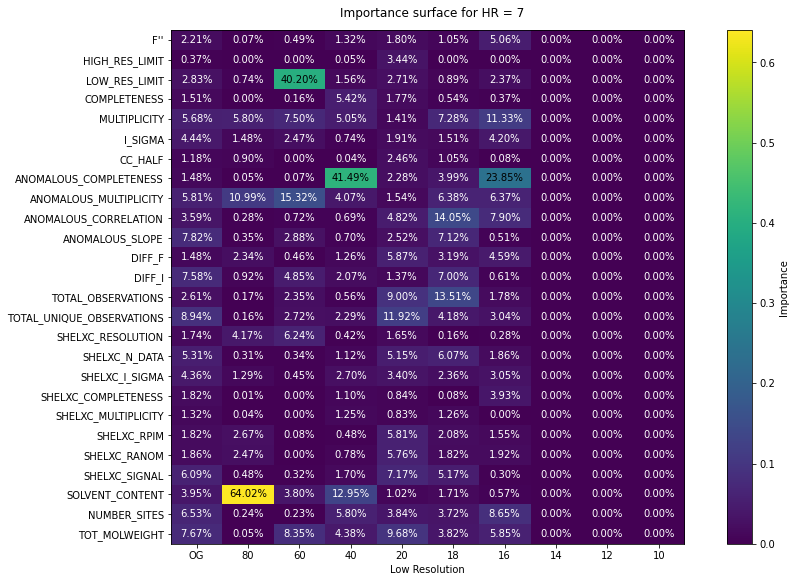

------------------------------------------------------------
3DII


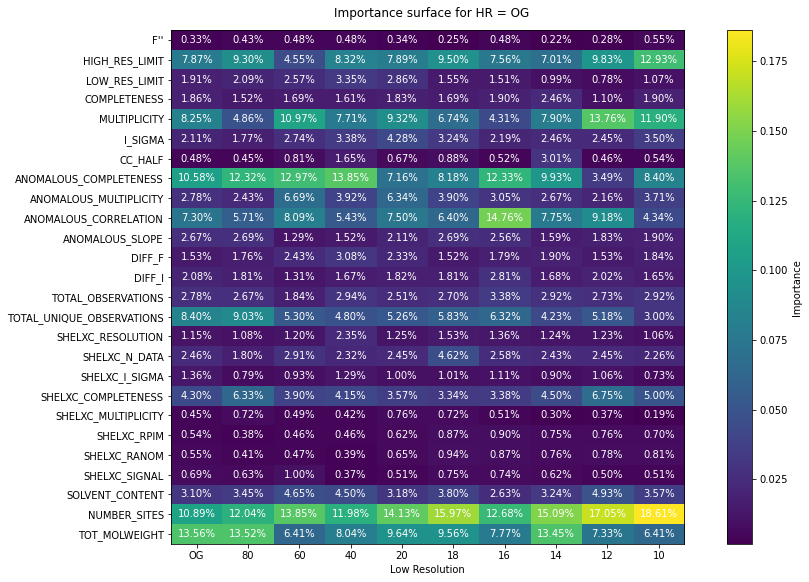

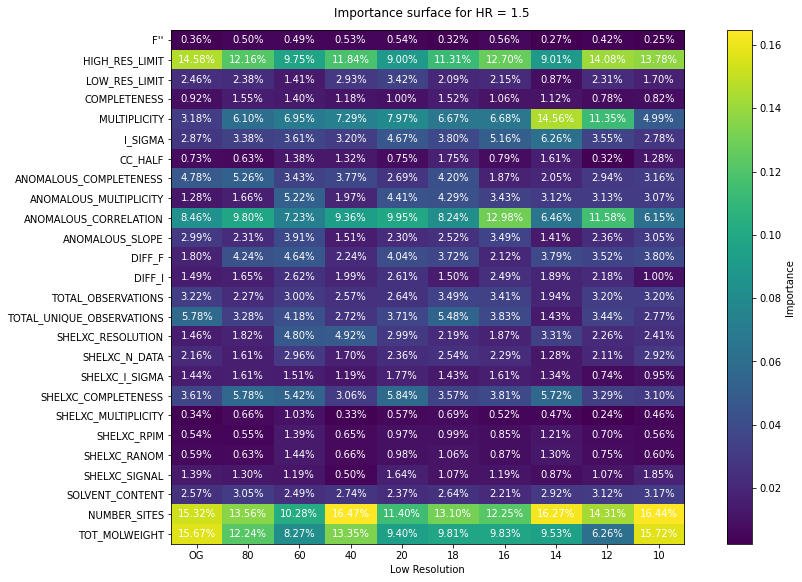

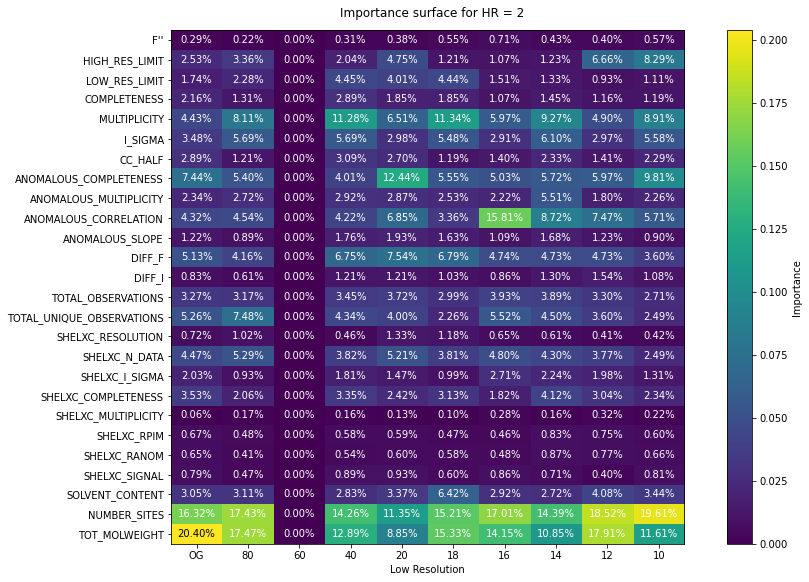

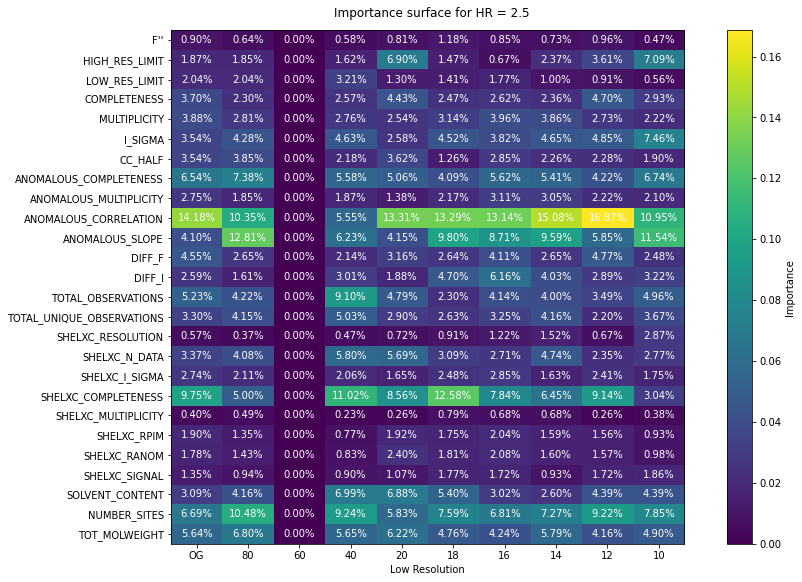

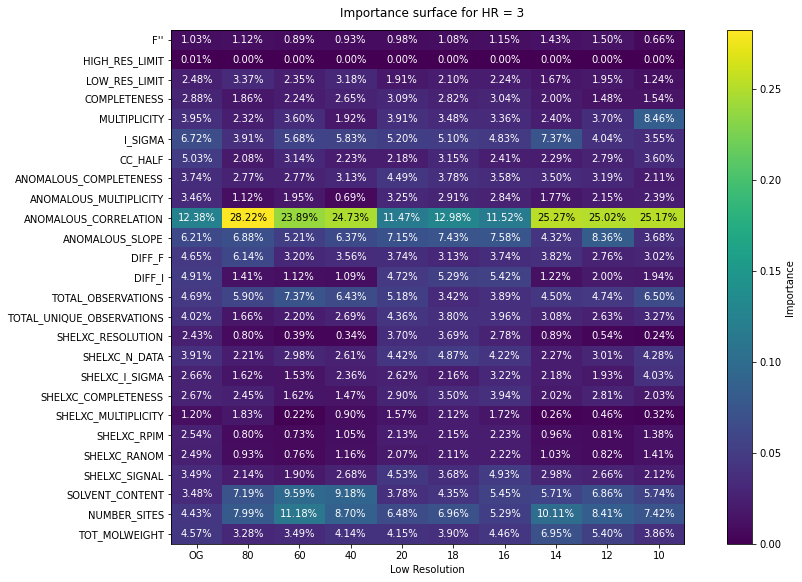

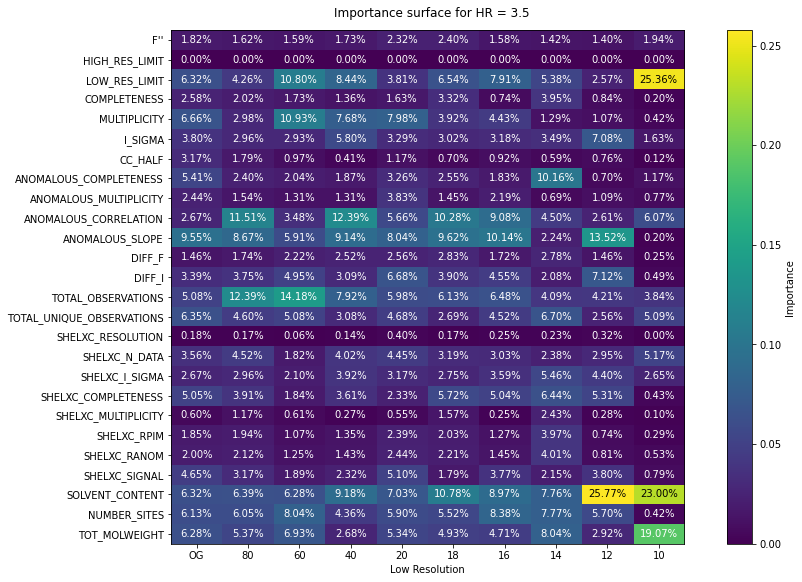

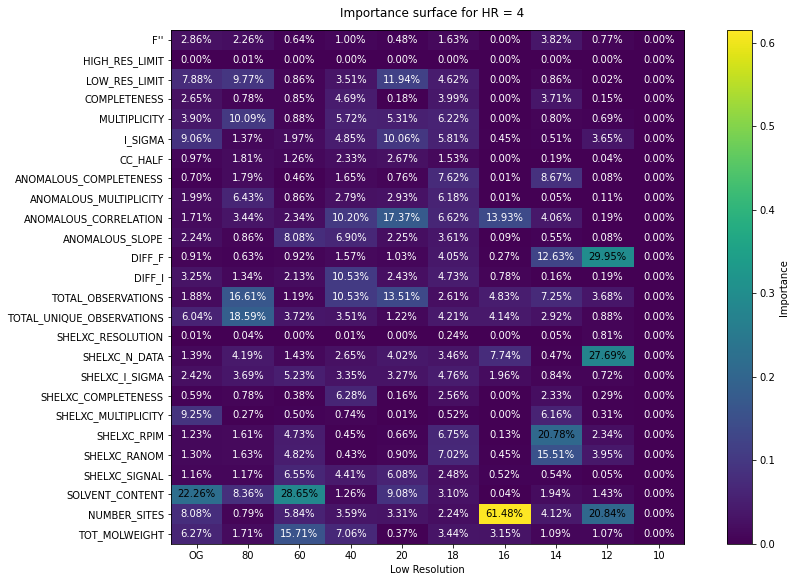

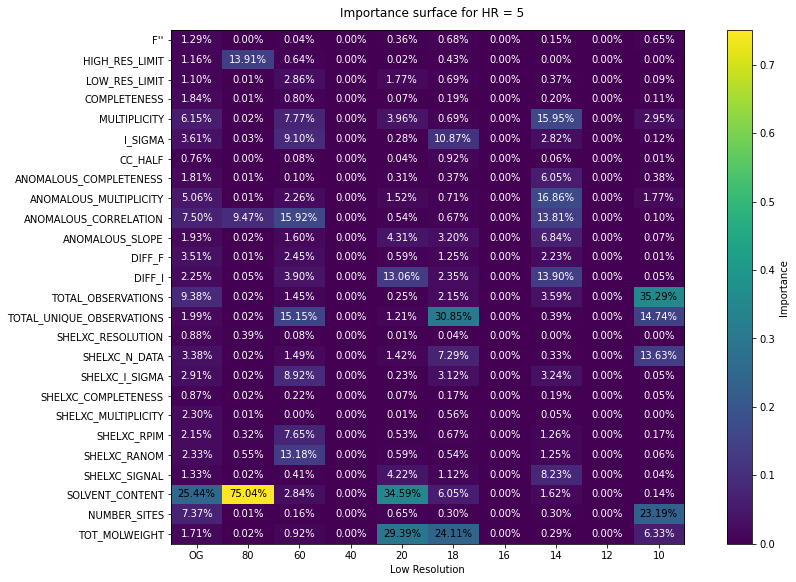

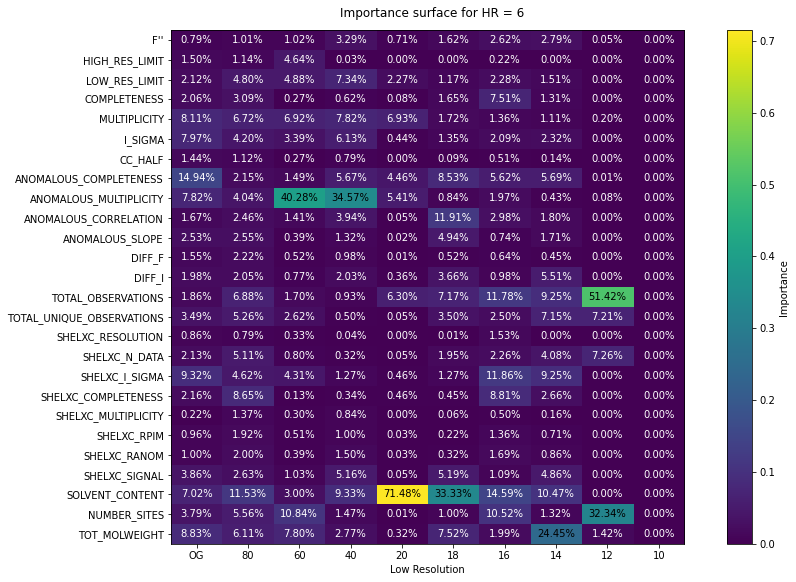

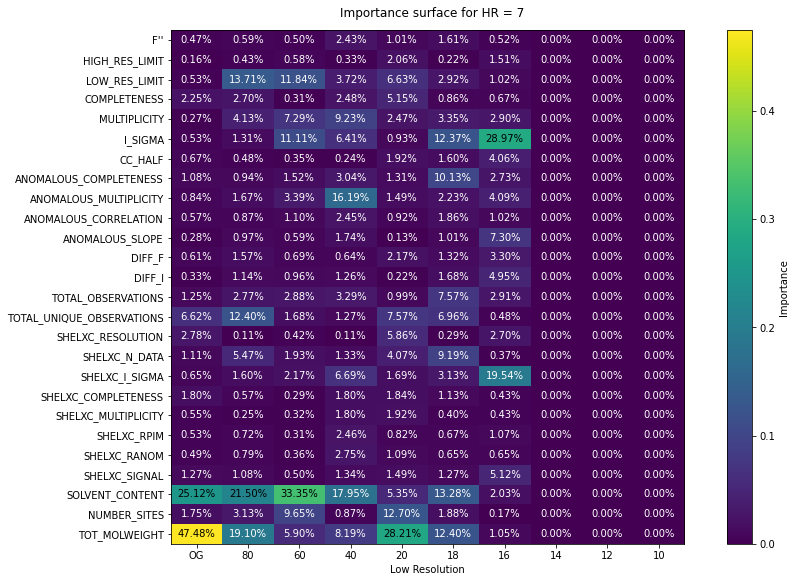

------------------------------------------------------------


In [48]:
lows, highs = ["OG", 80, 60, 40, 20, 18, 16, 14, 12, 10], ["OG", 1.5, 2, 2.5, 3, 3.5, 4, 5, 6, 7]


for db_kind in ["dials", "3dii"]:
    print(db_kind.upper())
    
    # get every feature importances
    topfeats, cols = [], None
    for i in range(1, 101):
        db_dir = fr"D:\Diamond\analysis\results\dataset_{i}\{db_kind}"
        try:
            topfeat = pd.read_csv(os.path.join(db_dir, "topfeat.csv"), squeeze=True, index_col=0)
            topfeats.append(topfeat.to_list())
        except FileNotFoundError:
            topfeats.append(np.zeros_like(topfeats[-1]))
            
        # store feature names
        cols = topfeat.index if cols is None else cols
    
    # store in dataframe
    topfeats = pd.DataFrame(topfeats, columns=cols, index=range(1, 101))
    
    # store array for every hr limit
    arr_list = np.array([topfeats[topfeats.index % 10 == last].values for last in list(range(1, 10)) + [0]])
    xx, yy = np.meshgrid(np.arange(len(topfeats.columns)), np.arange(len(lows)))

    for i, arr in enumerate(arr_list):
        fig = plt.figure(figsize=(12, 8))
        
        if plot_kind == "surface":
            # plot 3d surface
            ax = fig.add_subplot(projection="3d")
            img = ax.plot_surface(xx, yy, arr, cmap="viridis")
            ax.set_title(f"Importance surface for HR = {highs[i]}")
            
            # labels
            ax.set_xticks(range(len(topfeats.columns)))
            ax.set_xticklabels(topfeats.columns, rotation=60, ha="right", va="center_baseline")
            # ax.set_xlabel("Features")
            ax.set_yticks(range(len(lows)))
            ax.set_yticklabels(lows)
            ax.set_ylabel("Low Resolution")

        elif plot_kind == "heatmap":
            # plot annotated heatmap
            ax = fig.add_subplot()
            img = ax.imshow(arr.T)
            ax.grid(False)
            fig.suptitle(f"Importance surface for HR = {highs[i]}")
            
            # annotate
            for k in range(len(lows)):
                for j in range(len(topfeats.columns)):
                    num = arr[k, j]
                    c = "k" if num > 0.2 else "w"
                    plt.text(k, j, f"{num:.2%}", ha="center", va="center", color=c)
                    
            # set aspect ratio
            ratio = 1
            x_left, x_right = ax.get_xlim()
            y_low, y_high = ax.get_ylim()
            ax.set_aspect(abs((x_right - x_left) / (y_low - y_high)) * ratio)
            plt.tight_layout()
            
            # labels
            ax.set_yticks(range(len(topfeats.columns)))
            ax.set_yticklabels(topfeats.columns, va="center_baseline")
            # ax.set_xlabel("Features")
            ax.set_xticks(range(len(lows)))
            ax.set_xticklabels(lows)
            ax.set_xlabel("Low Resolution")

        
        else:
            raise NameError("Please make sure the specified plot kind is either 'heatmap' or 'surface'")

        # colorbar
        fig.colorbar(img, label="Importance", ax=ax)


        # show results
        plt.show()
    
    print("-"*60)

## Method 2: Figure per LR

The same can be done but switching around the LR/HR.

DIALS


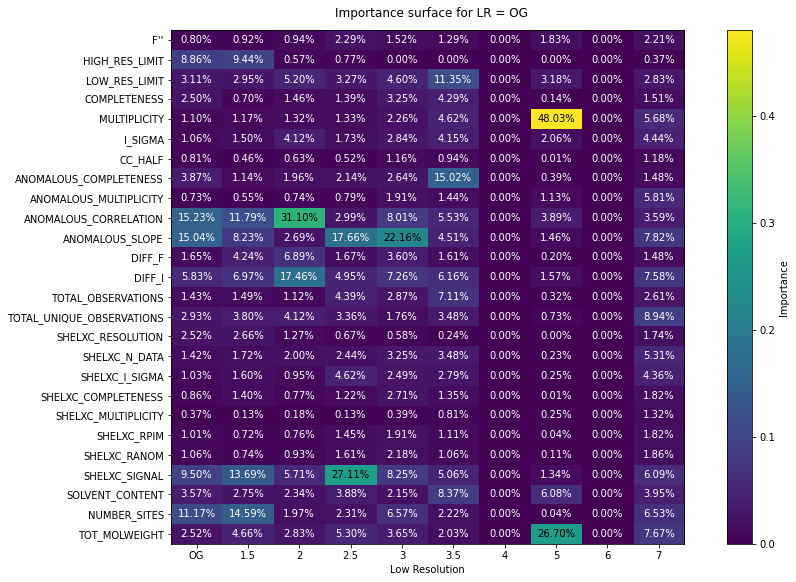

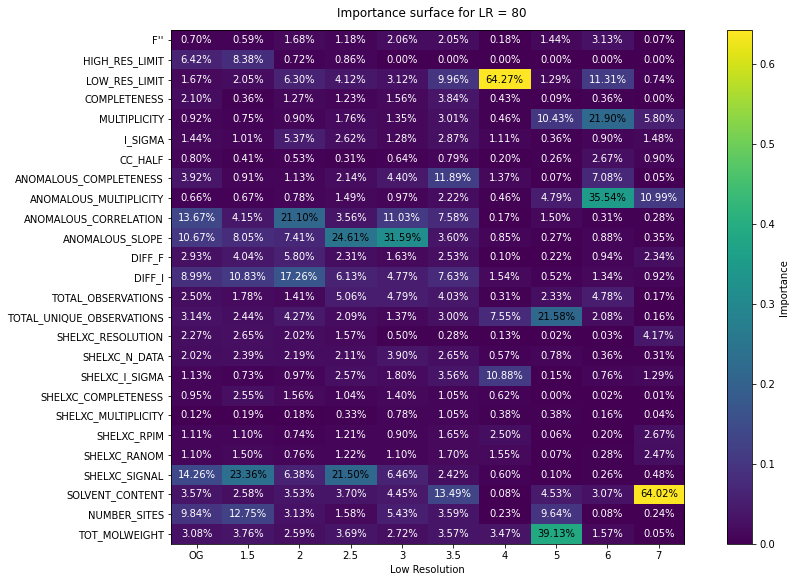

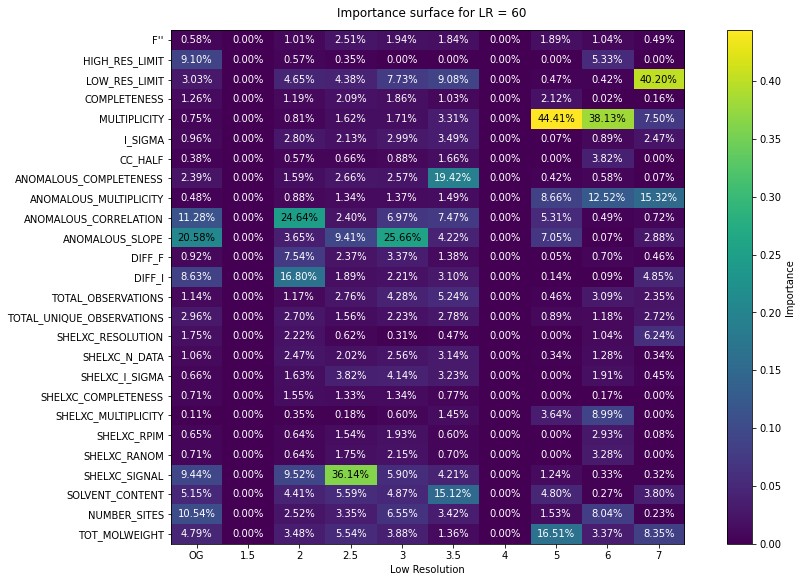

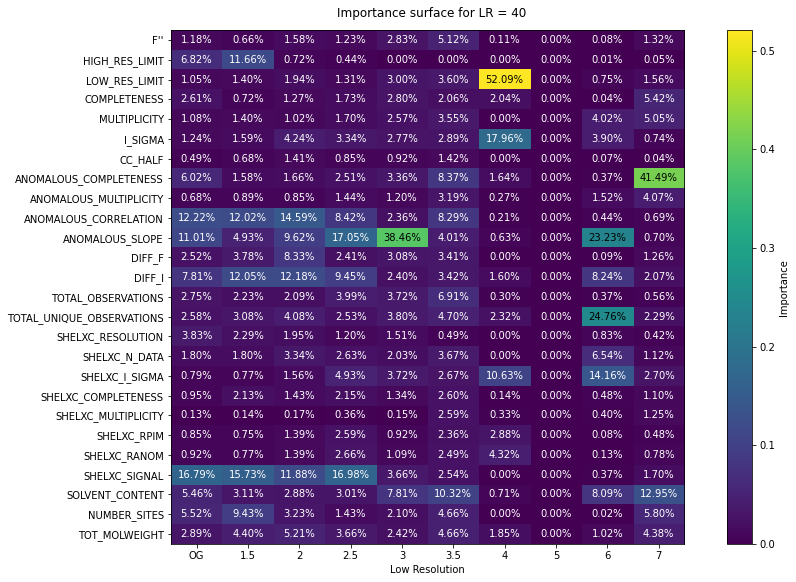

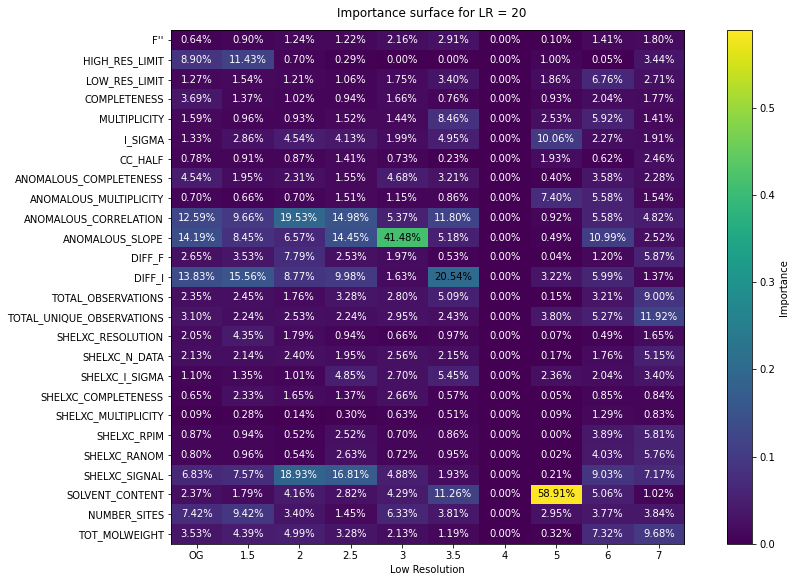

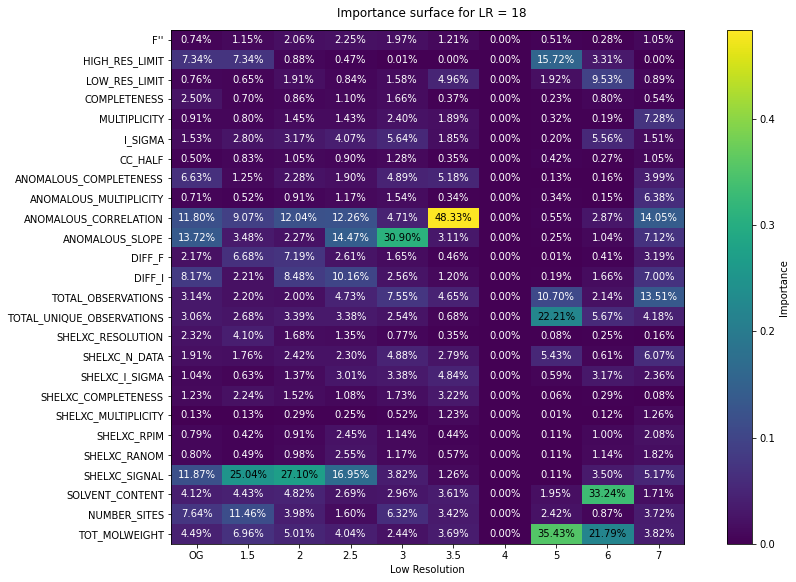

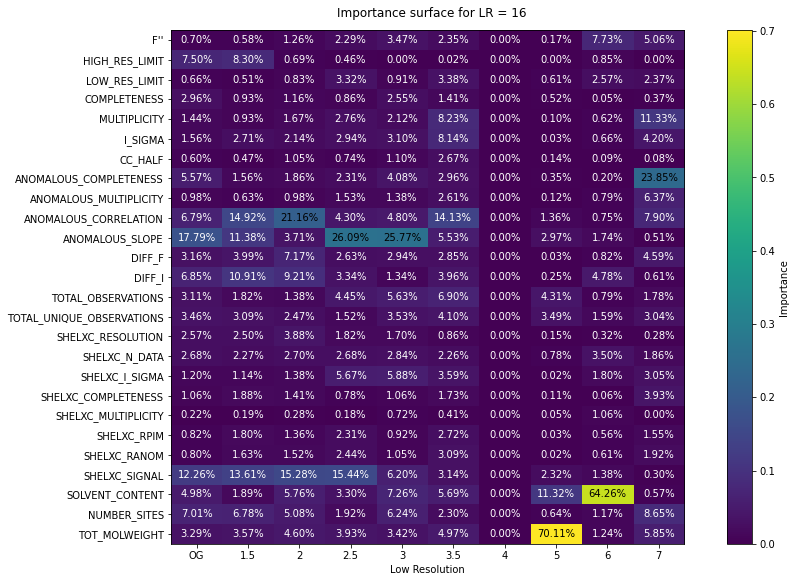

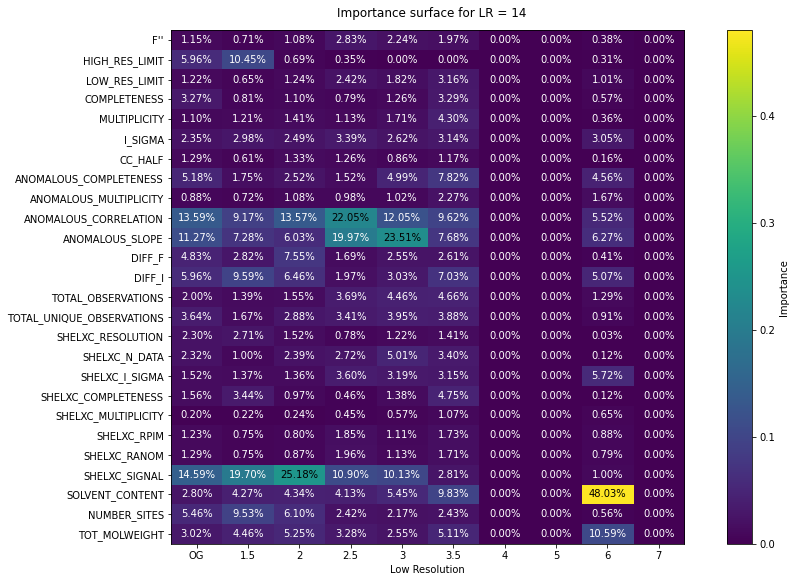

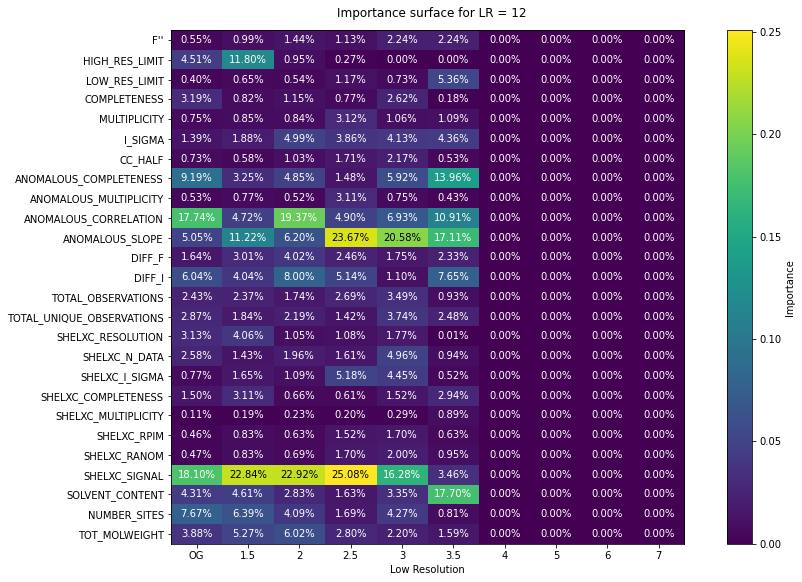

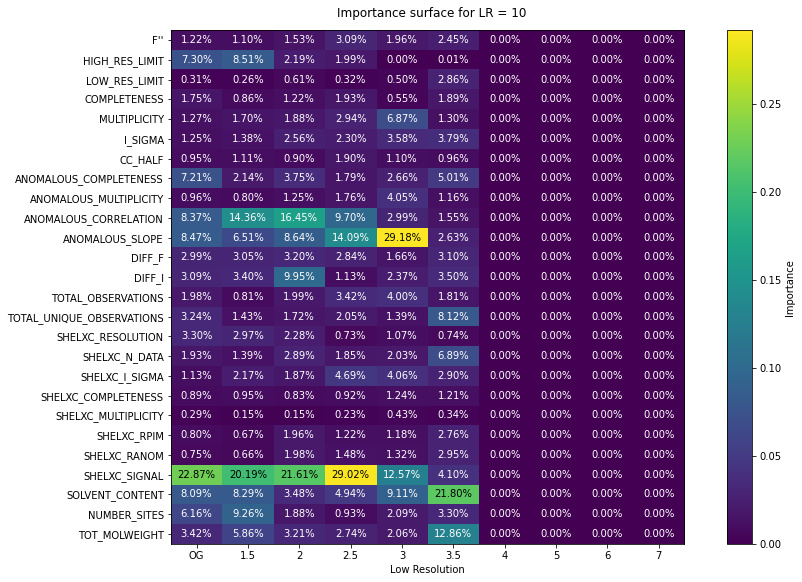

------------------------------------------------------------
3DII


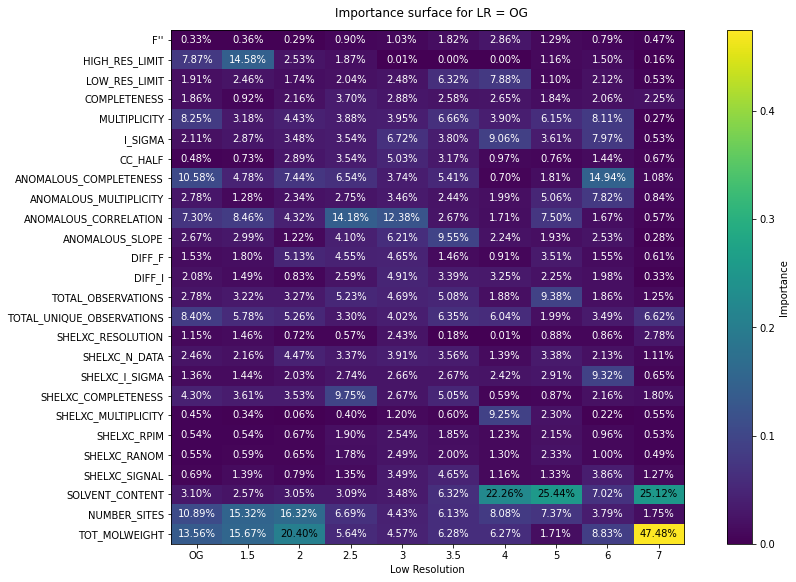

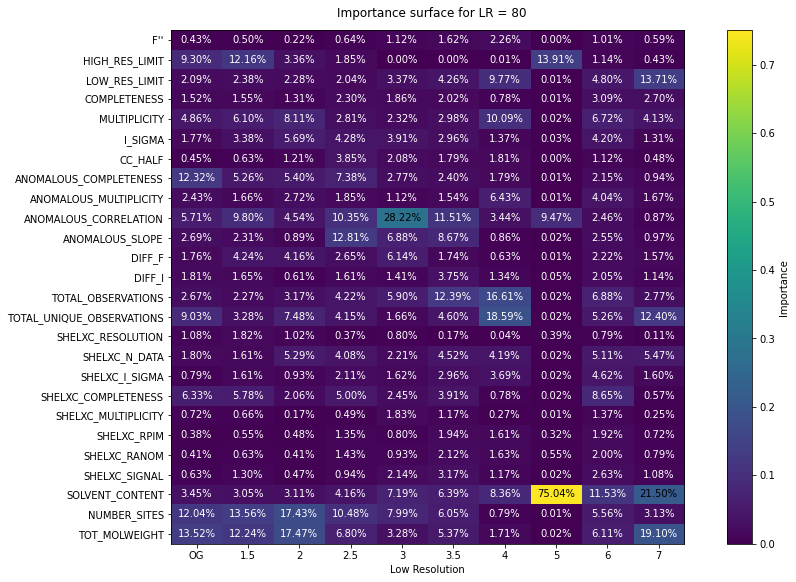

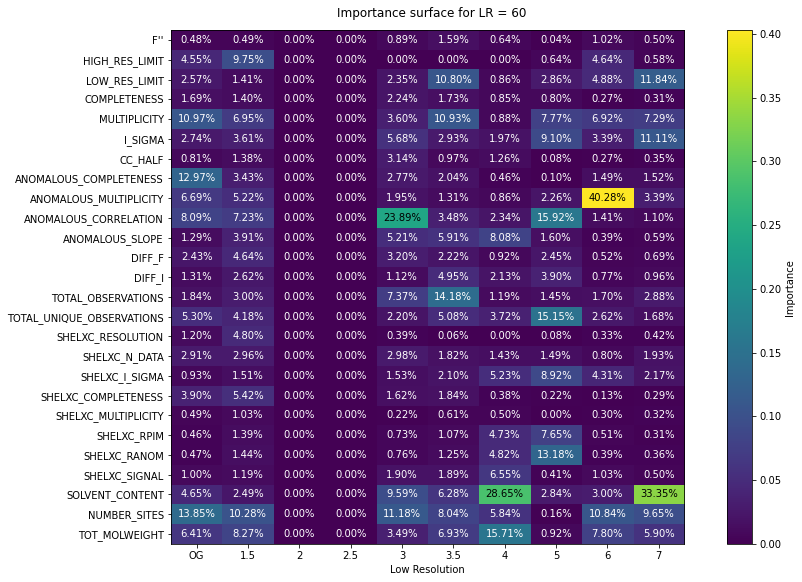

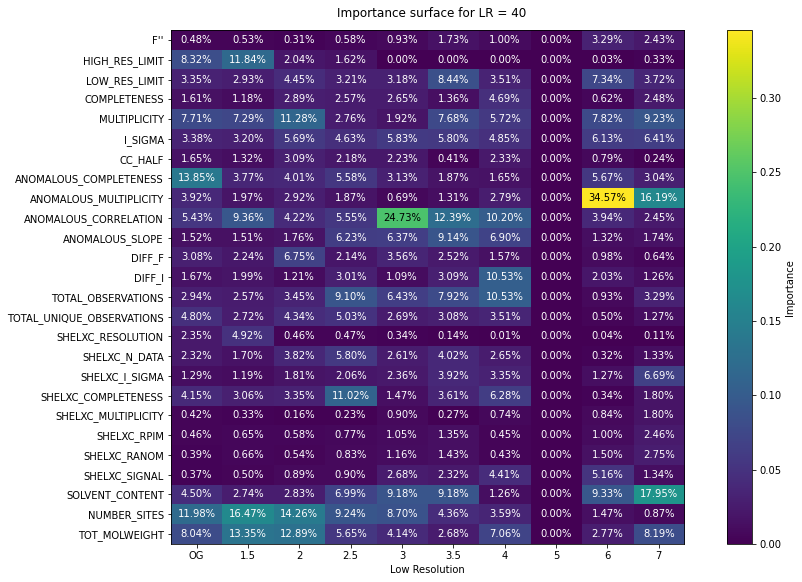

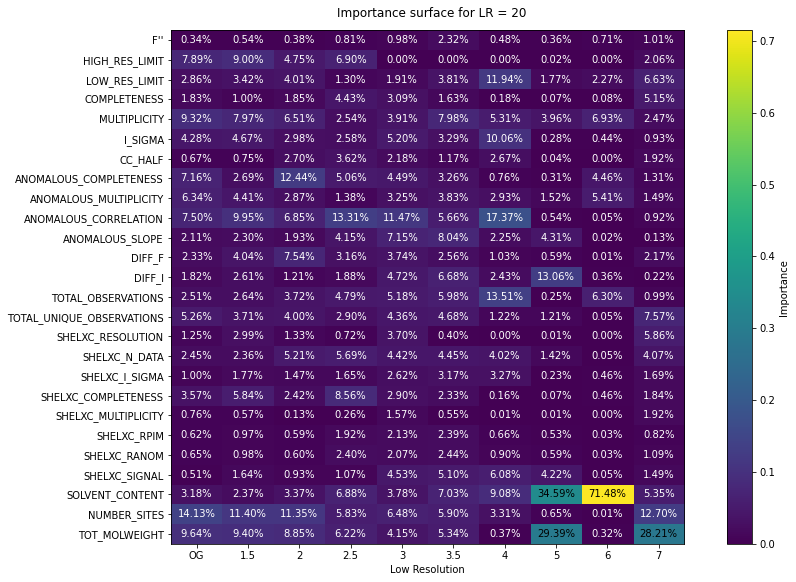

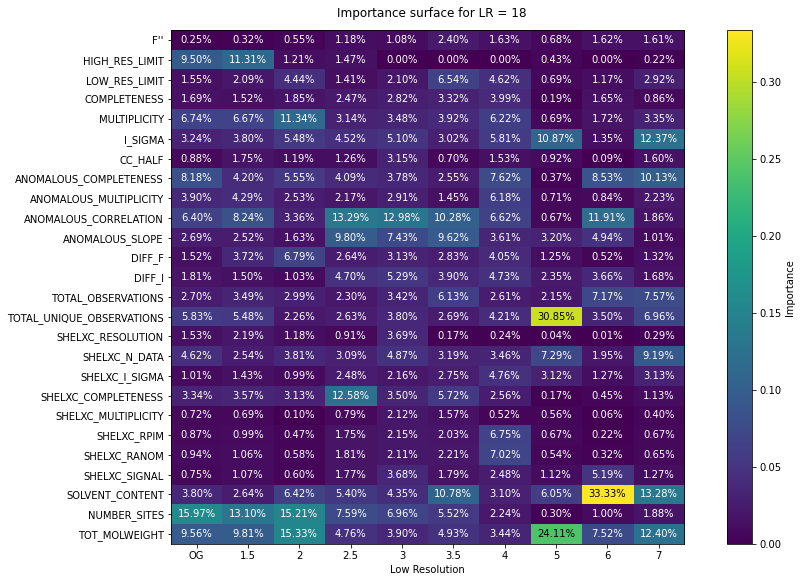

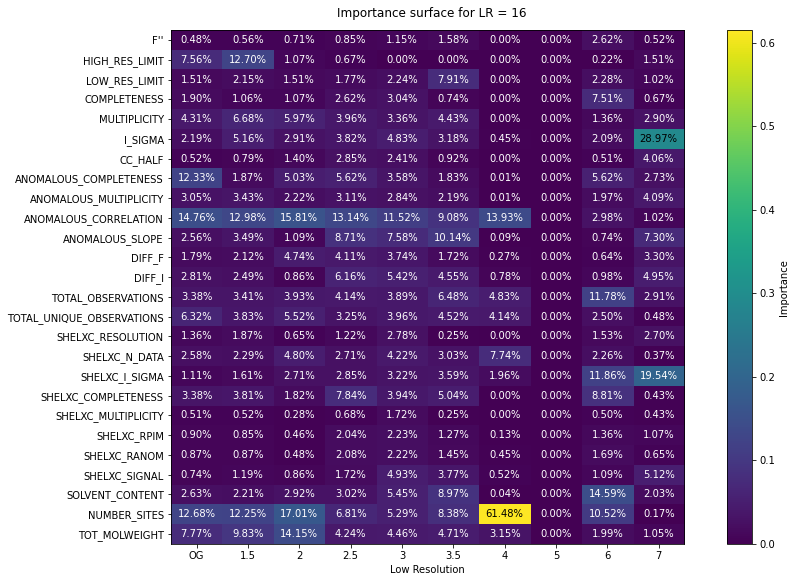

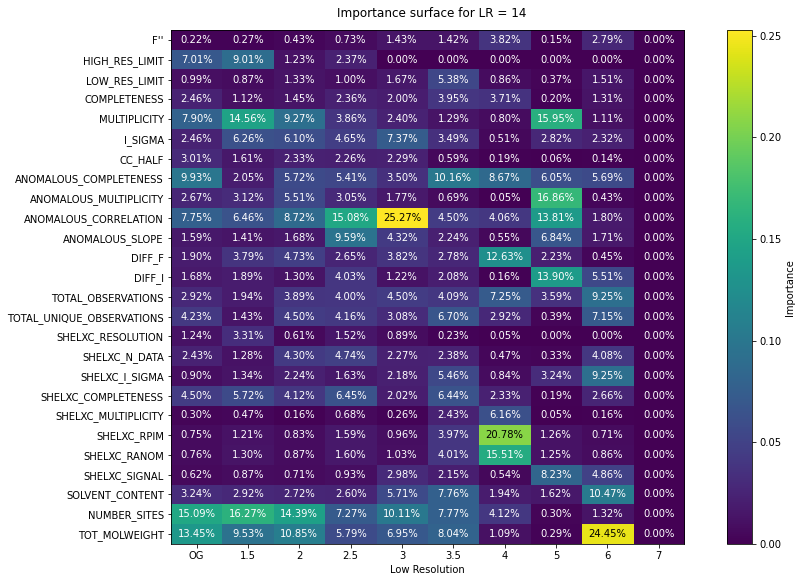

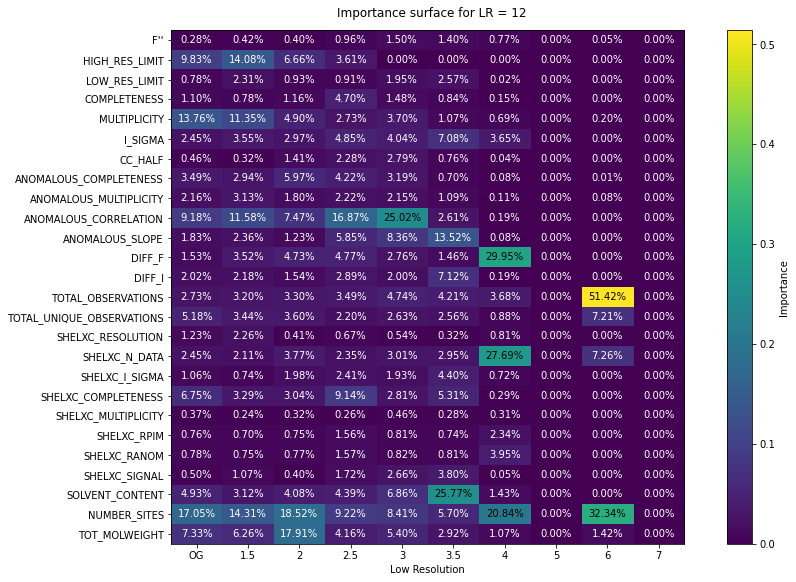

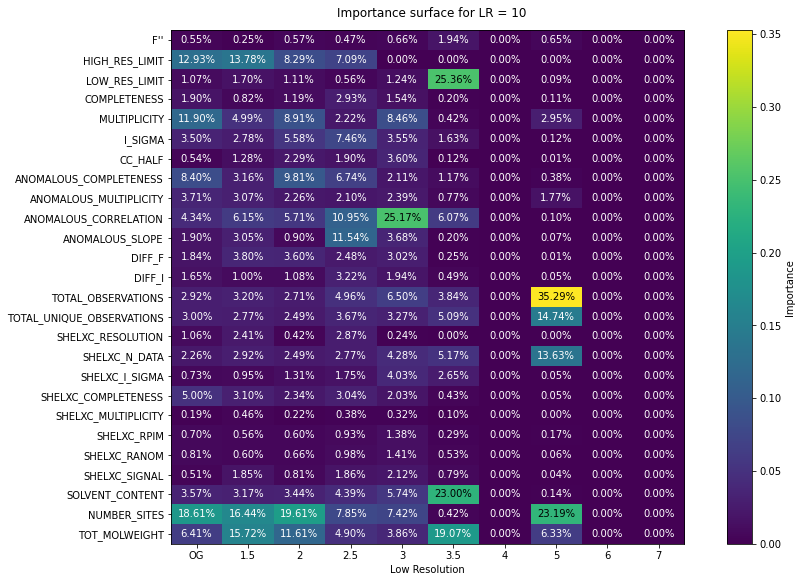

------------------------------------------------------------


In [54]:
for db_kind in ["dials", "3dii"]:
    print(db_kind.upper())
    
    # get every feature importances
    topfeats, cols = [], None
    for i in range(1, 101):
        db_dir = fr"D:\Diamond\analysis\results\dataset_{i}\{db_kind}"
        try:
            topfeat = pd.read_csv(os.path.join(db_dir, "topfeat.csv"), squeeze=True, index_col=0)
            topfeats.append(topfeat.to_list())
        except FileNotFoundError:
            topfeats.append(np.zeros_like(topfeats[-1]))
            
        # store feature names
        cols = topfeat.index if cols is None else cols
    
    # store in dataframe
    topfeats = pd.DataFrame(topfeats, columns=cols, index=range(1, 101))

    for i in range(10):
        fig = plt.figure(figsize=(12, 8))
        # data for single LR
        arr = topfeats.values[i*10:i*10+10]
        
        plot_kind="heatmap"
        if plot_kind == "surface":
            xx, yy = np.meshgrid(np.arange(len(topfeats.columns)), np.arange(len(lows)))
            
            # plot 3d surface
            ax = fig.add_subplot(projection="3d")
            img = ax.plot_surface(xx, yy, arr, cmap="viridis")
            ax.set_title(f"Importance surface for LR = {lows[i]}")
            
            # labels
            ax.set_xticks(range(len(topfeats.columns)))
            ax.set_xticklabels(topfeats.columns, rotation=60, ha="right", va="center_baseline")
            # ax.set_xlabel("Features")
            ax.set_yticks(range(len(highs)))
            ax.set_yticklabels(highs)
            ax.set_ylabel("Low Resolution")

        elif plot_kind == "heatmap":
            # plot annotated heatmap
            ax = fig.add_subplot()
            img = ax.imshow(arr.T)
            ax.grid(False)
            fig.suptitle(f"Importance surface for LR = {lows[i]}")
            
            # annotate
            for k in range(len(lows)):
                for j in range(len(topfeats.columns)):
                    num = arr[k, j]
                    c = "k" if num > 0.2 else "w"
                    plt.text(k, j, f"{num:.2%}", ha="center", va="center", color=c)
            
            # set aspect ratio
            ratio = 1
            x_left, x_right = ax.get_xlim()
            y_low, y_high = ax.get_ylim()
            ax.set_aspect(abs((x_right - x_left) / (y_low - y_high)) * ratio)
            plt.tight_layout()
            
            # labels
            ax.set_yticks(range(len(topfeats.columns)))
            ax.set_yticklabels(topfeats.columns, va="center_baseline")
            # ax.set_xlabel("Features")
            ax.set_xticks(range(len(highs)))
            ax.set_xticklabels(highs)
            ax.set_xlabel("Low Resolution")

        else:
            raise NameError("Please make sure the specified plot kind is either 'heatmap' or 'surface'")

        
        # colorbar
        fig.colorbar(img, label="Importance", ax=ax)
        

        # show results
        plt.show()
    
    print("-"*60)

## Method 3: Figure per Feature

The last method is the same, however each figure is for a single feature, and the resulting plot depends on the LR/HR.

In [3]:
plot_kind = "heatmap"  # "surface" or "heatmap"
lows, highs = ["OG", 80, 60, 40, 20, 18, 16, 14, 12, 10], ["OG", 1.5, 2, 2.5, 3, 3.5, 4, 5, 6, 7]

DIALS
F''


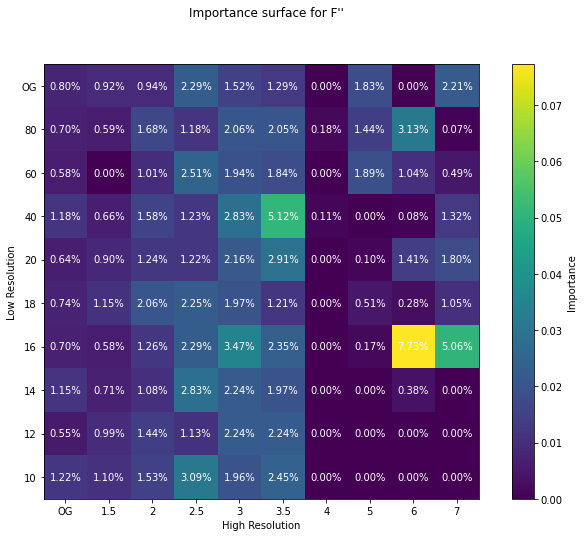

HIGH_RES_LIMIT


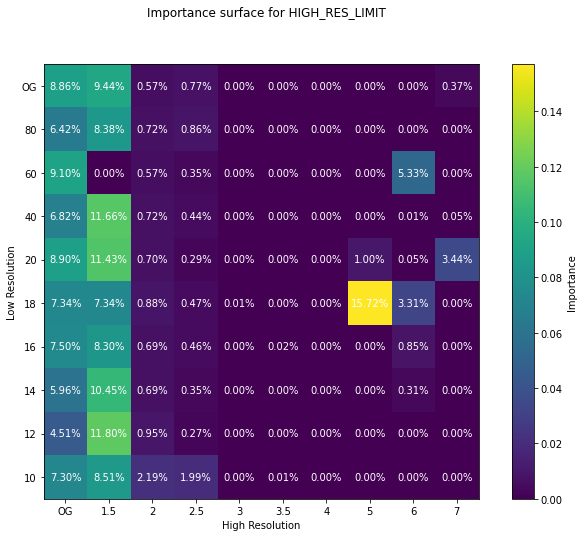

LOW_RES_LIMIT


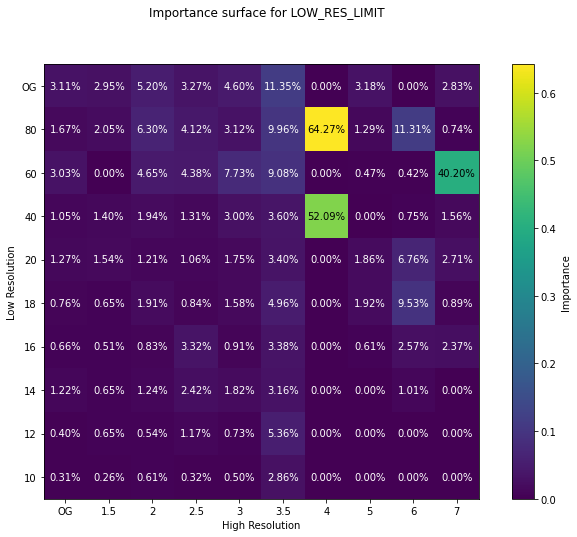

COMPLETENESS


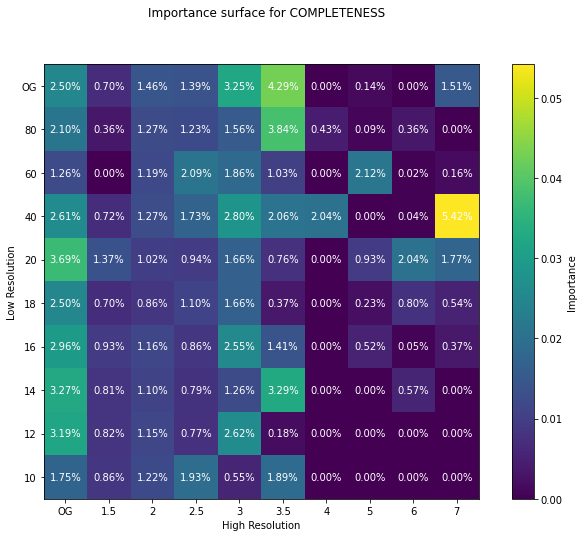

MULTIPLICITY


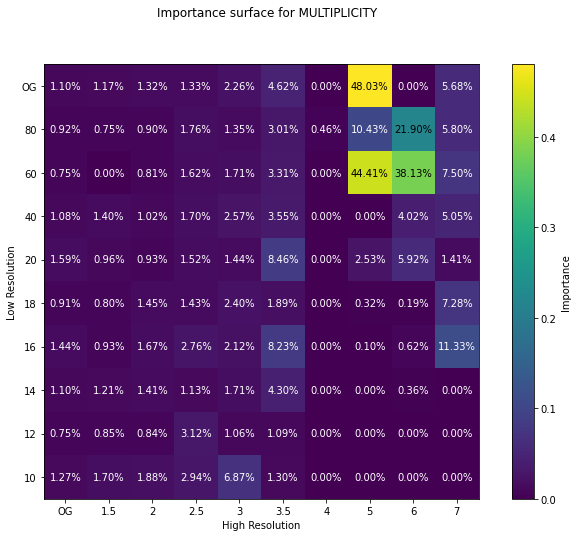

I_SIGMA


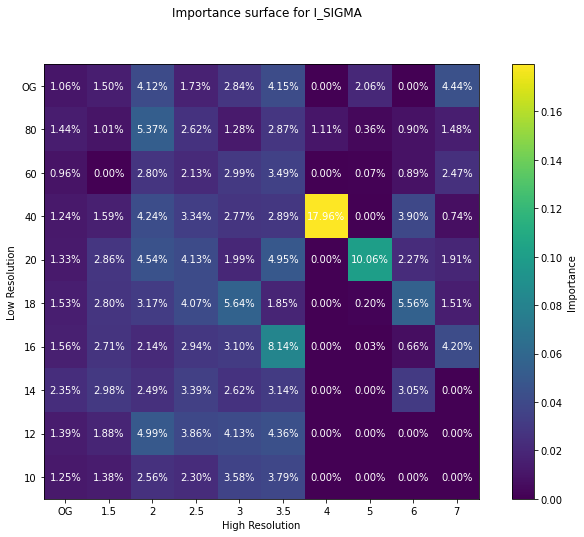

CC_HALF


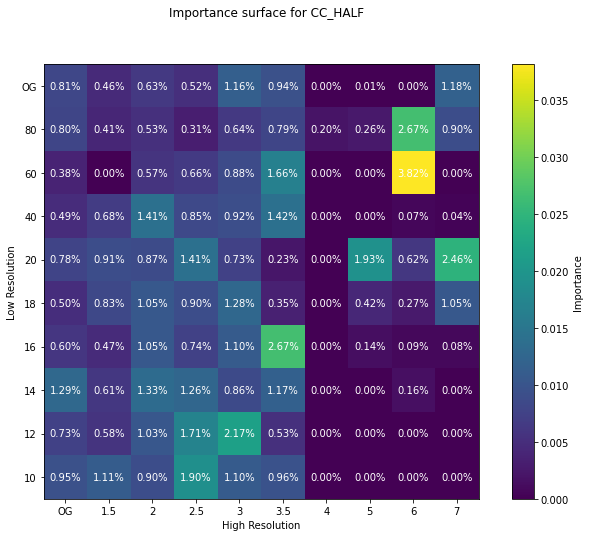

ANOMALOUS_COMPLETENESS


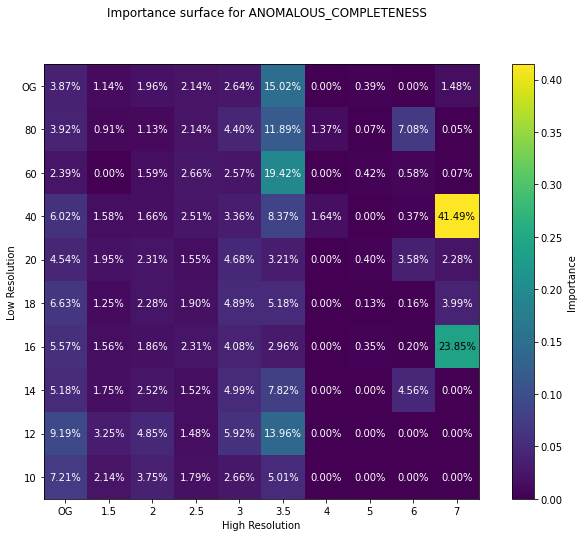

ANOMALOUS_MULTIPLICITY


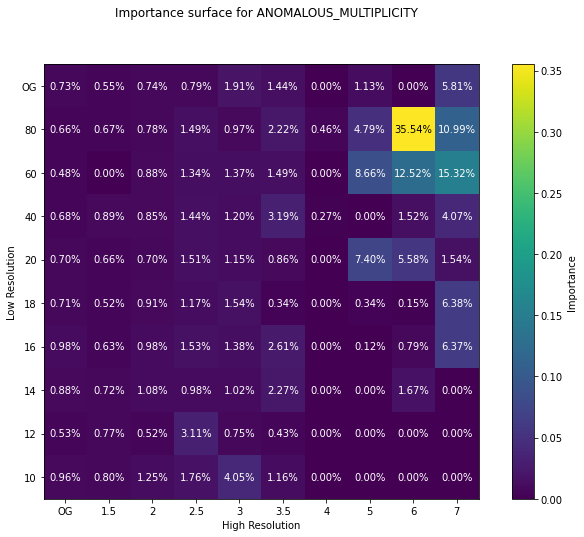

ANOMALOUS_CORRELATION


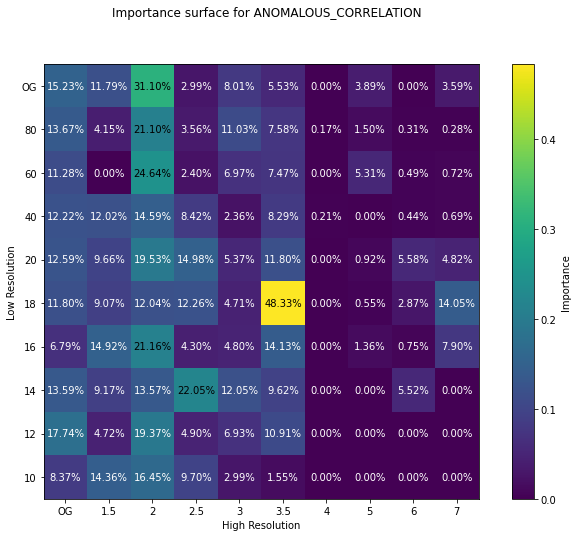

ANOMALOUS_SLOPE


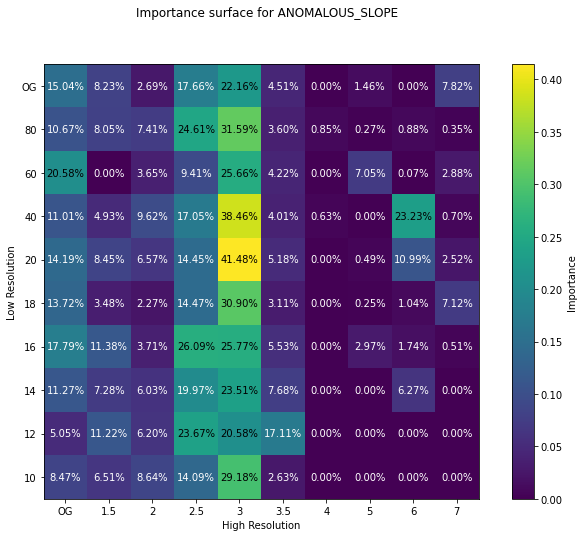

DIFF_F


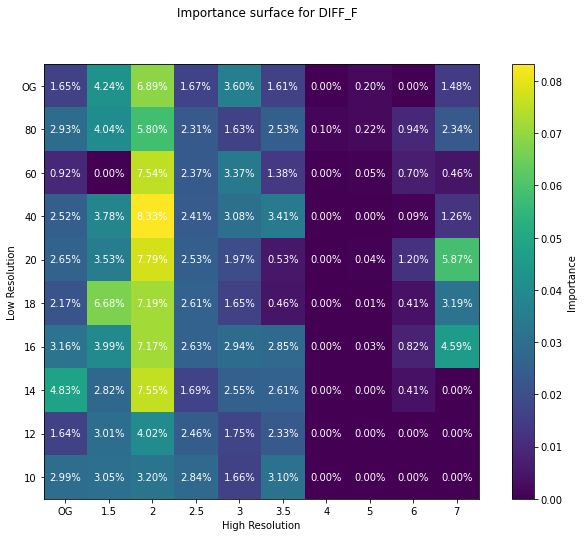

DIFF_I


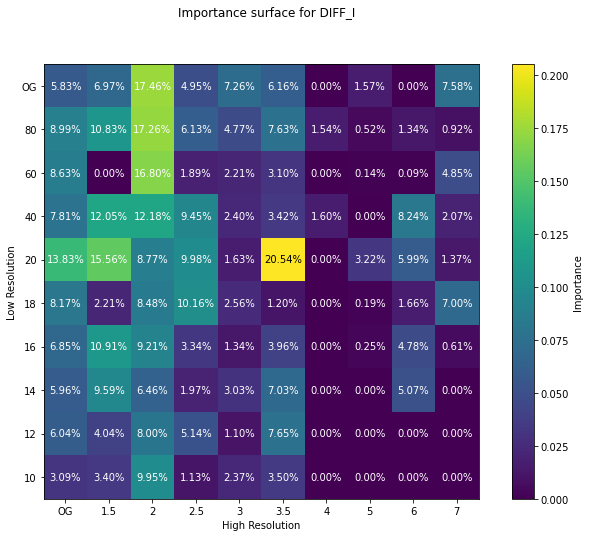

TOTAL_OBSERVATIONS


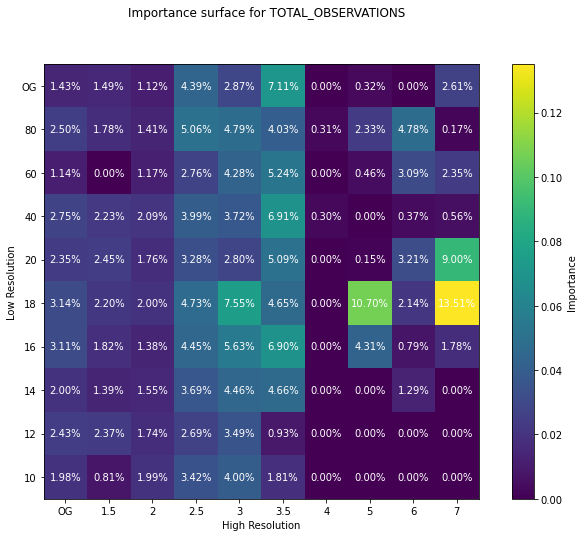

TOTAL_UNIQUE_OBSERVATIONS


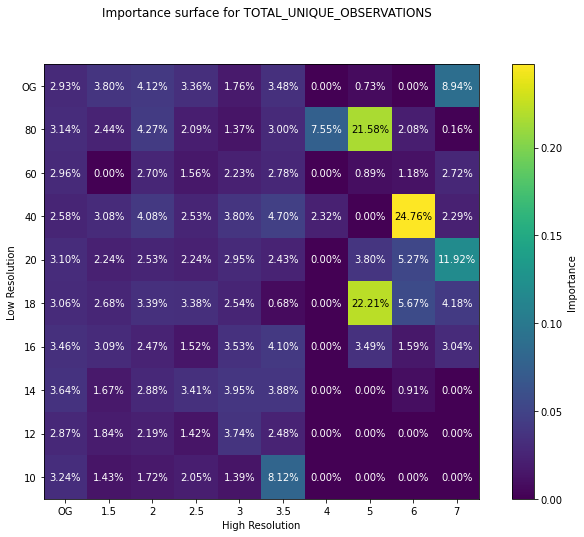

SHELXC_RESOLUTION


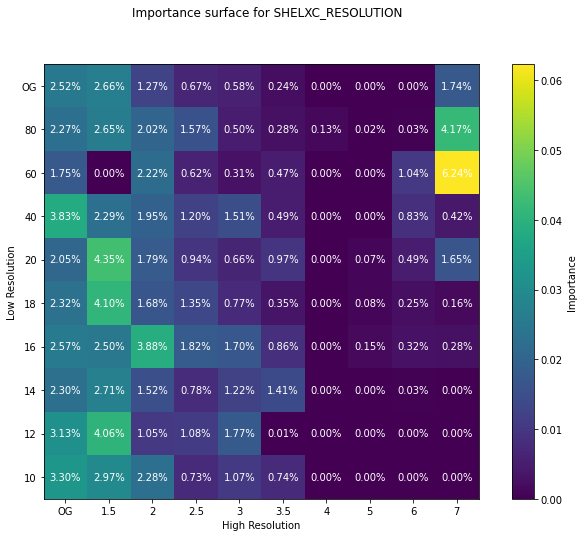

SHELXC_N_DATA


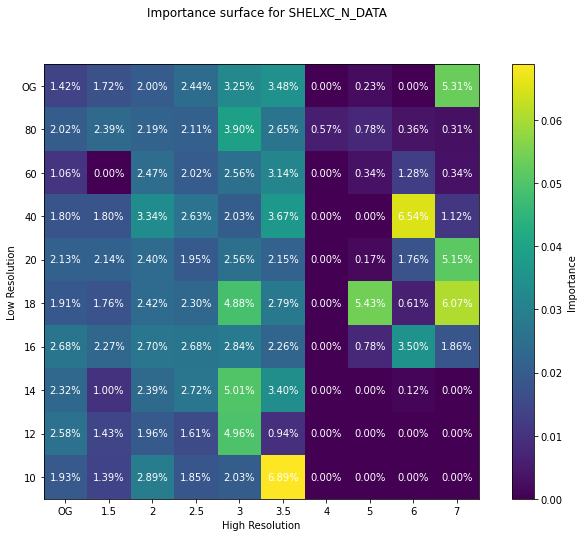

SHELXC_I_SIGMA


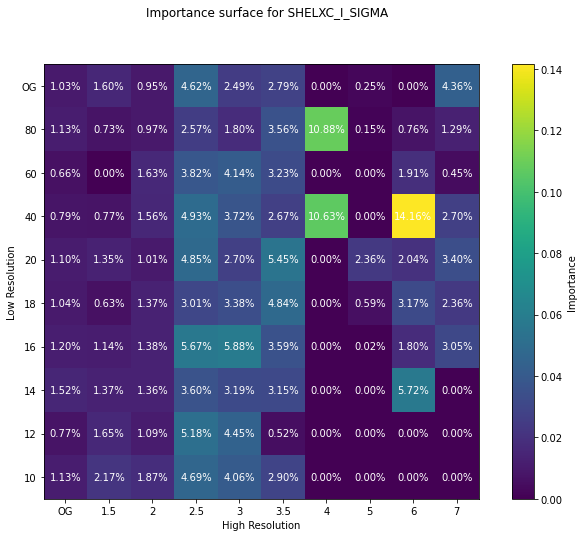

SHELXC_COMPLETENESS


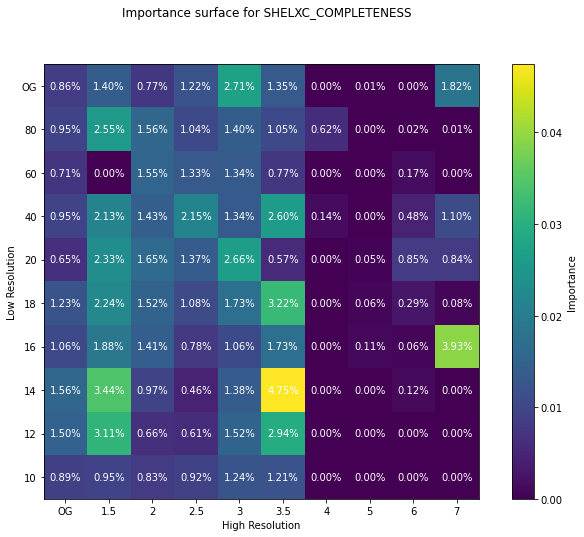

SHELXC_MULTIPLICITY


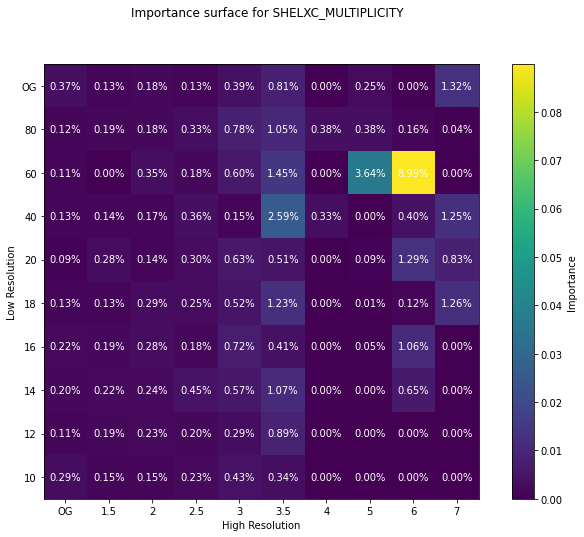

SHELXC_RPIM


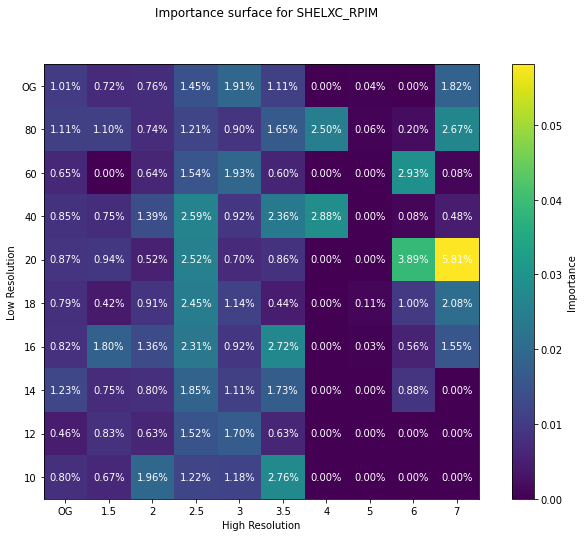

SHELXC_RANOM


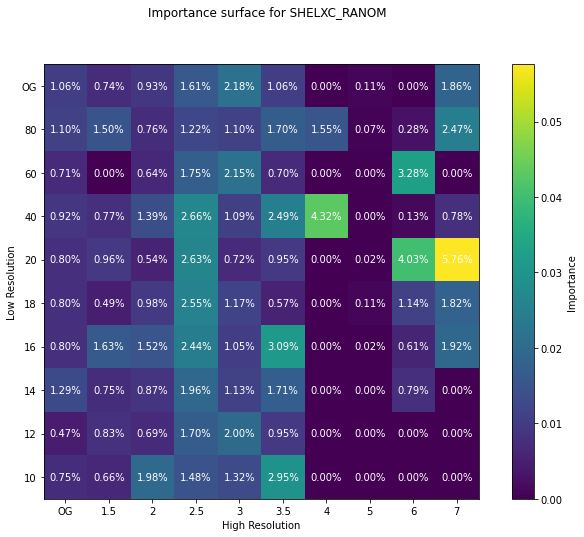

SHELXC_SIGNAL


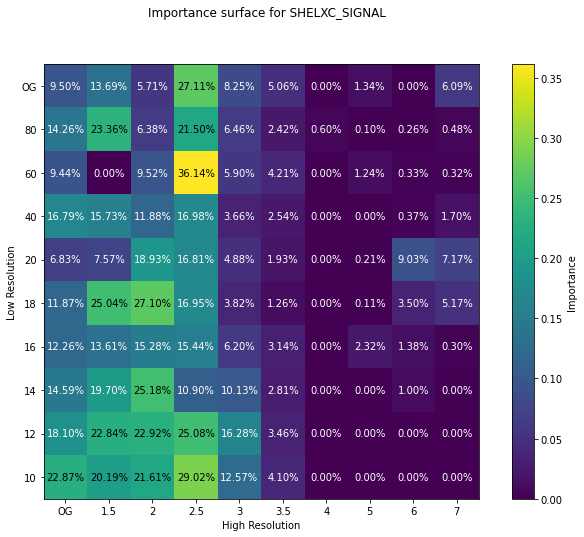

SOLVENT_CONTENT


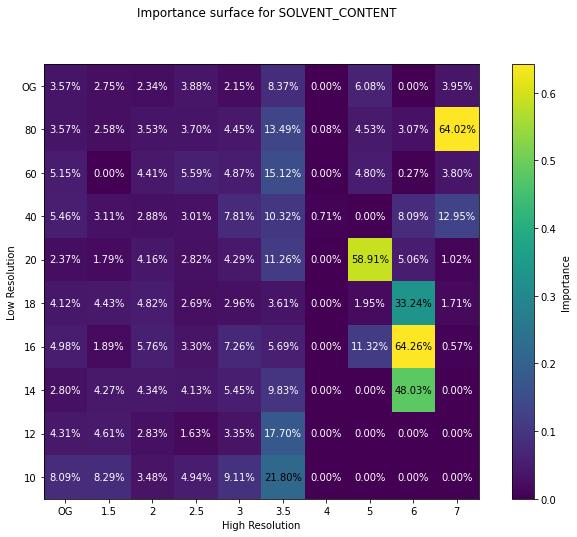

NUMBER_SITES


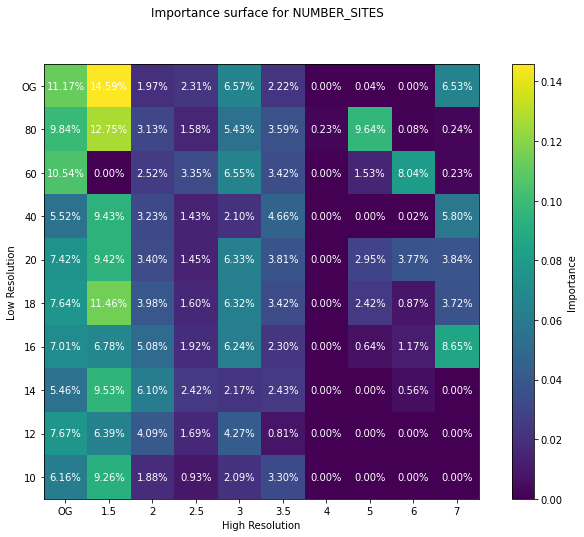

TOT_MOLWEIGHT


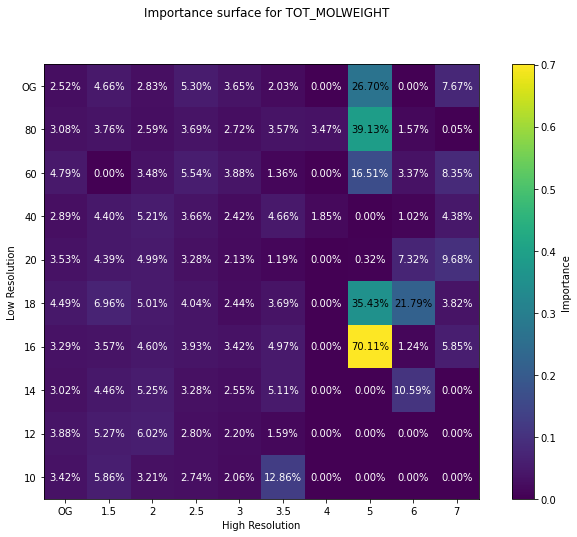

------------------------------------------------------------
3DII
F''


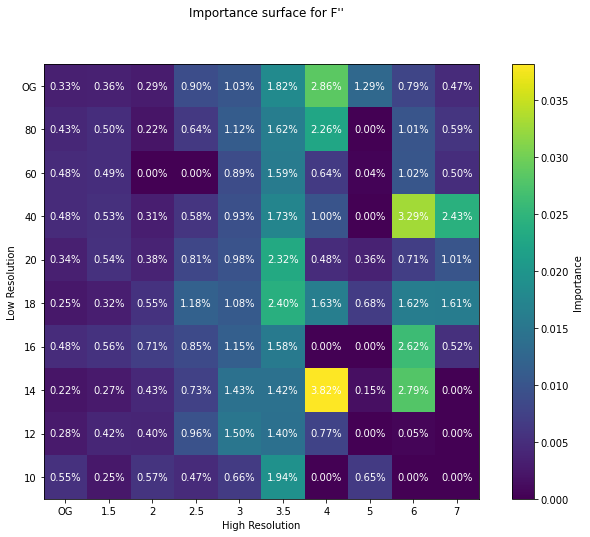

HIGH_RES_LIMIT


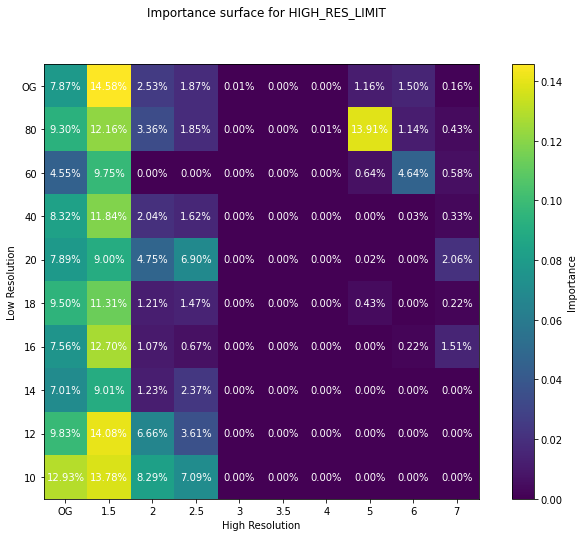

LOW_RES_LIMIT


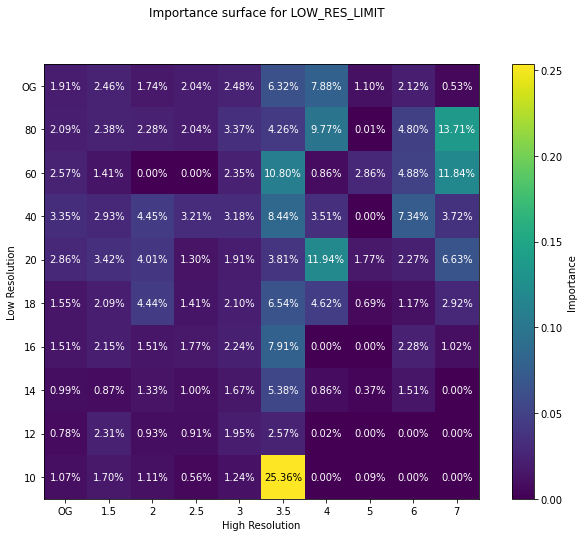

COMPLETENESS


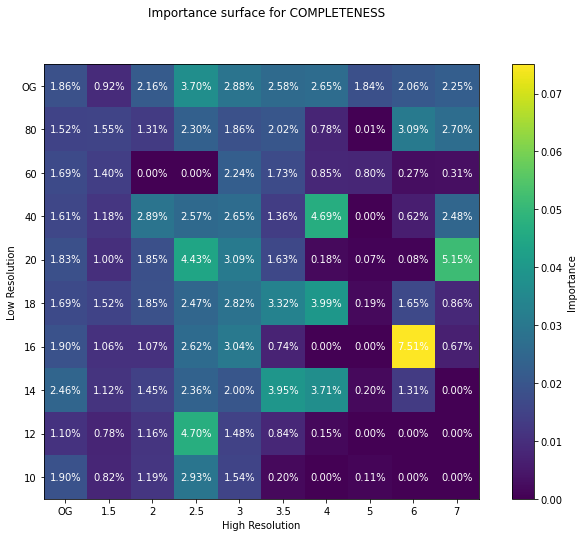

MULTIPLICITY


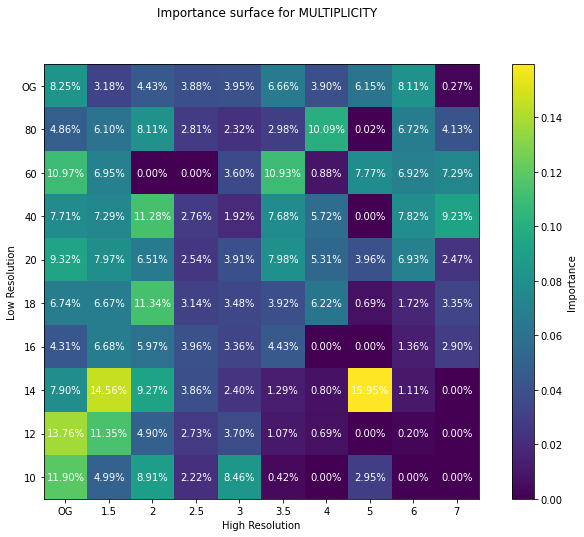

I_SIGMA


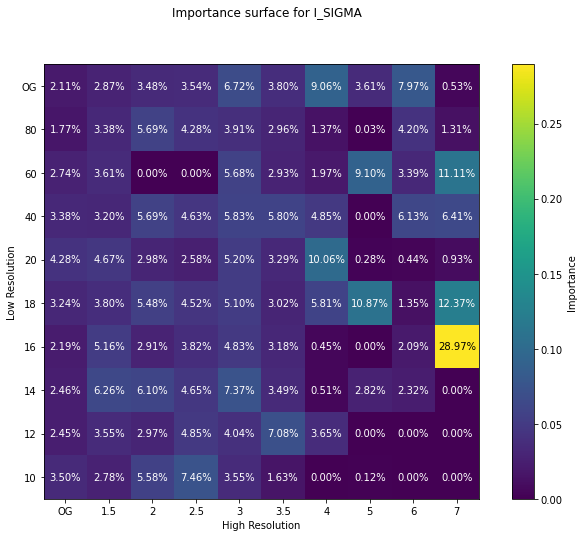

CC_HALF


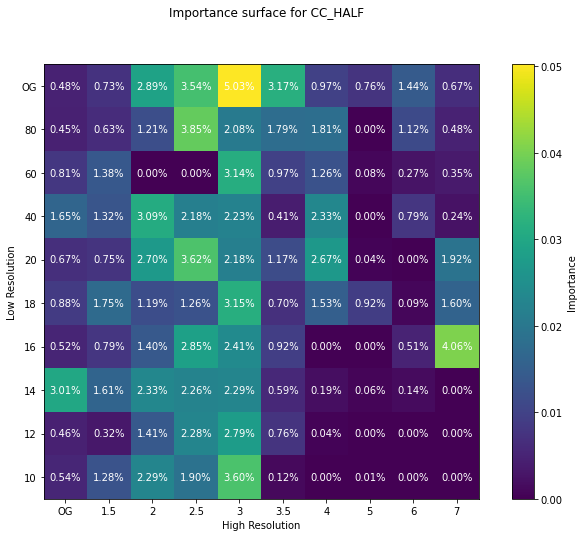

ANOMALOUS_COMPLETENESS


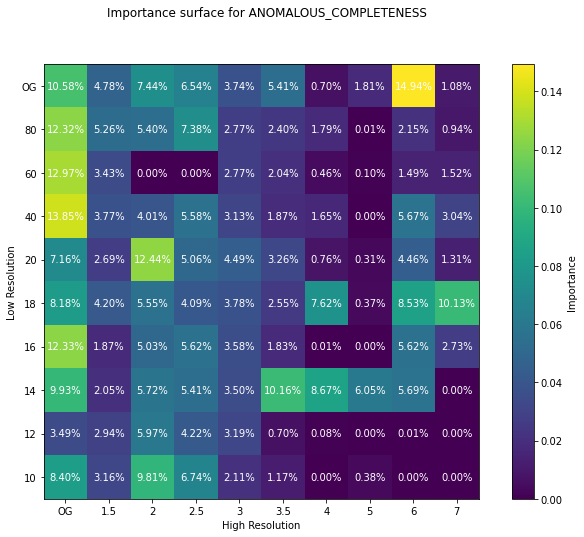

ANOMALOUS_MULTIPLICITY


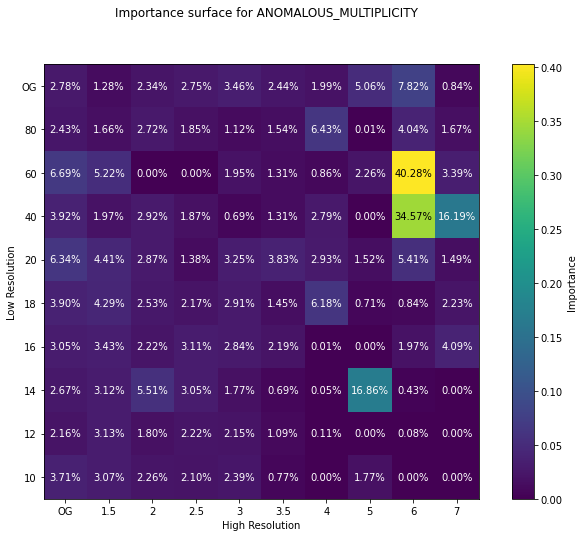

ANOMALOUS_CORRELATION


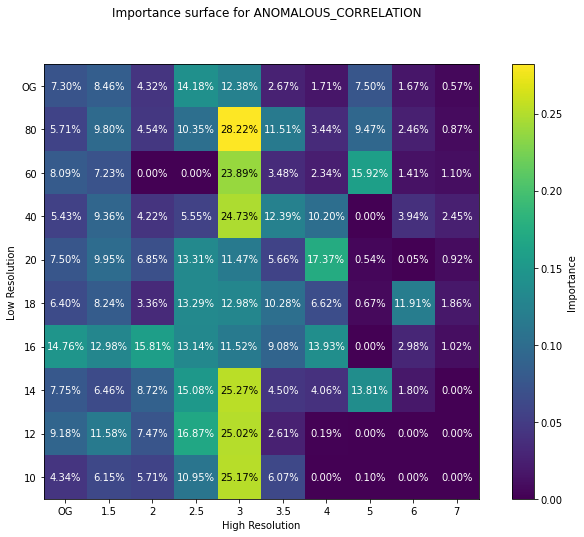

ANOMALOUS_SLOPE


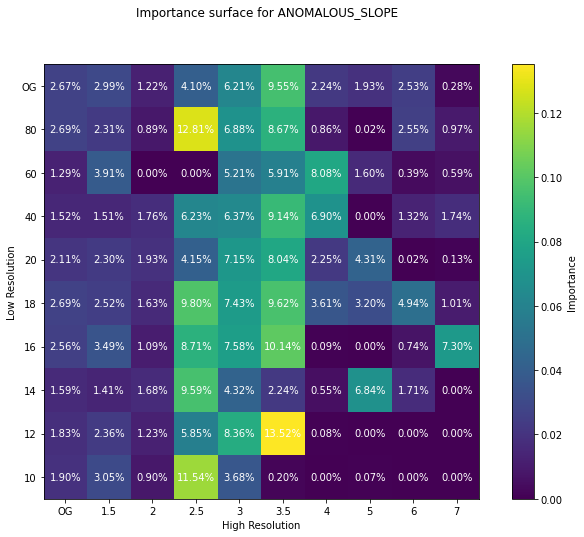

DIFF_F


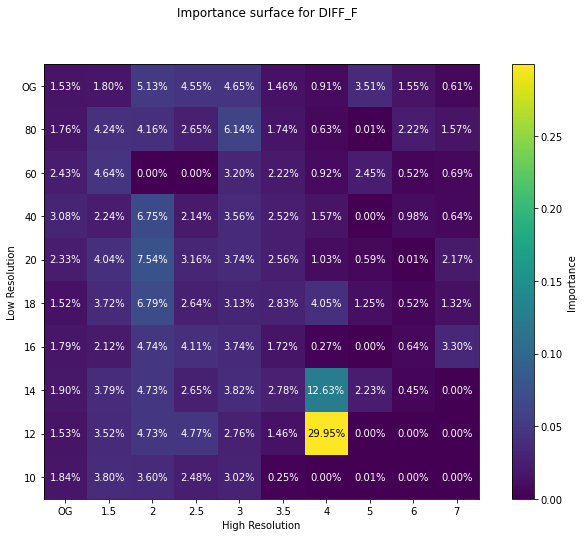

DIFF_I


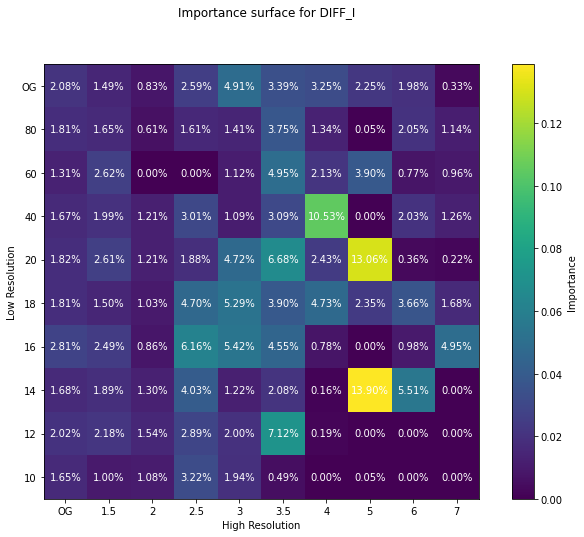

TOTAL_OBSERVATIONS


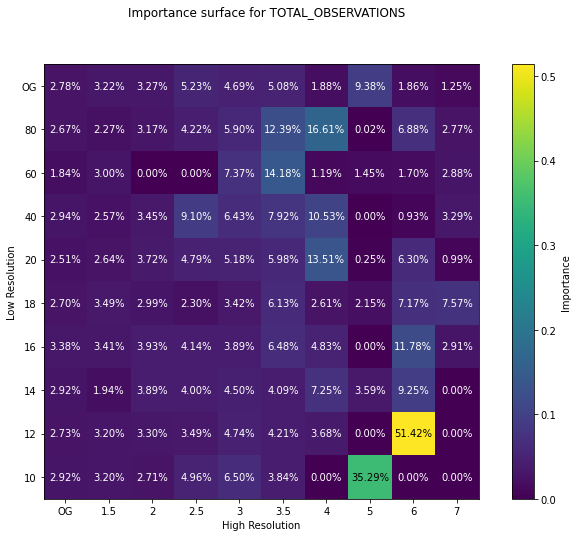

TOTAL_UNIQUE_OBSERVATIONS


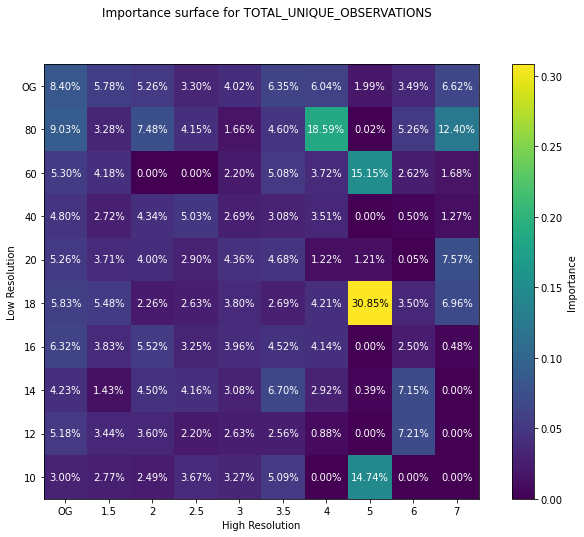

SHELXC_RESOLUTION


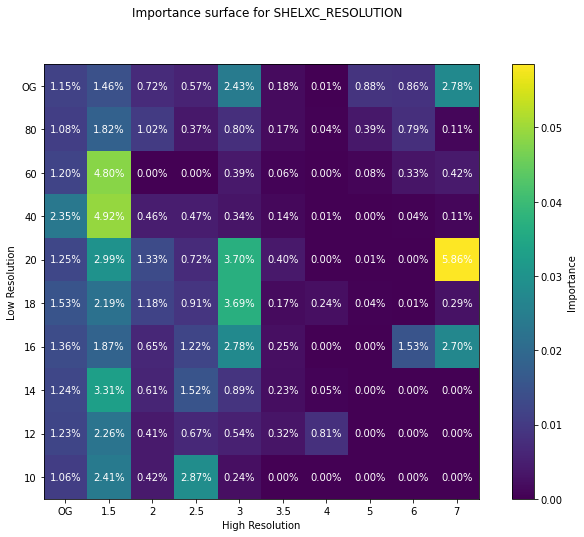

SHELXC_N_DATA


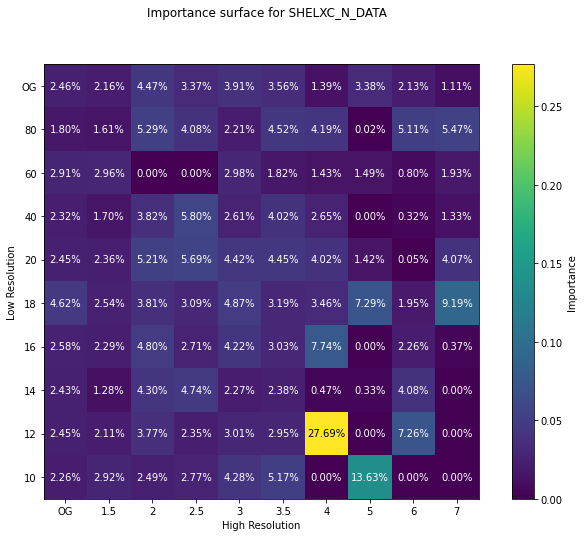

SHELXC_I_SIGMA


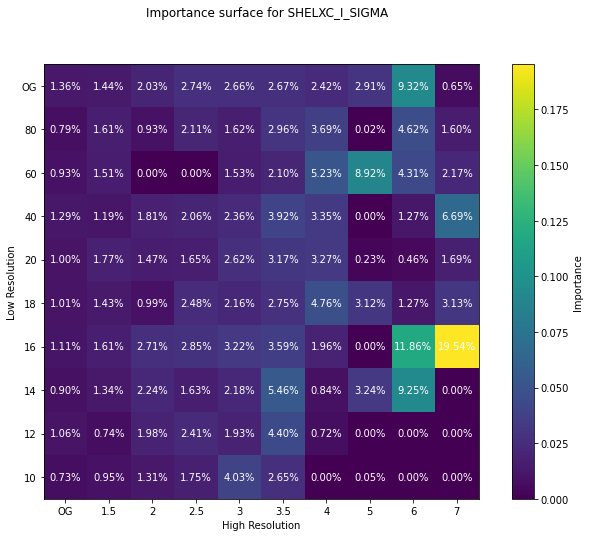

SHELXC_COMPLETENESS


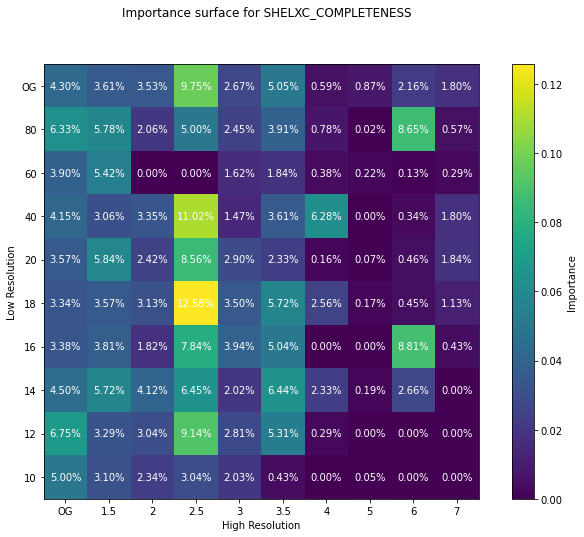

SHELXC_MULTIPLICITY


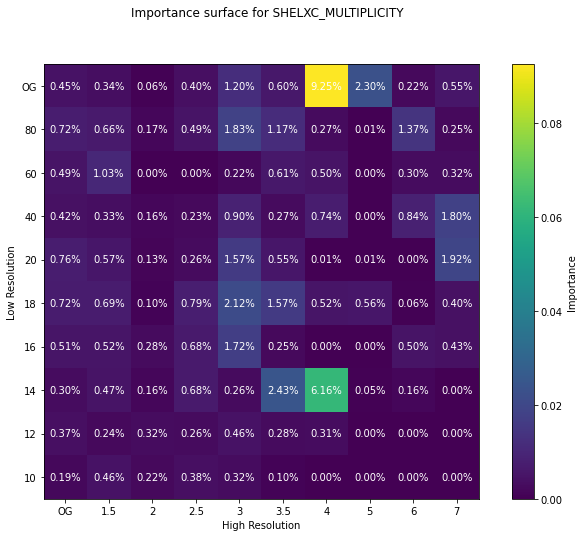

SHELXC_RPIM


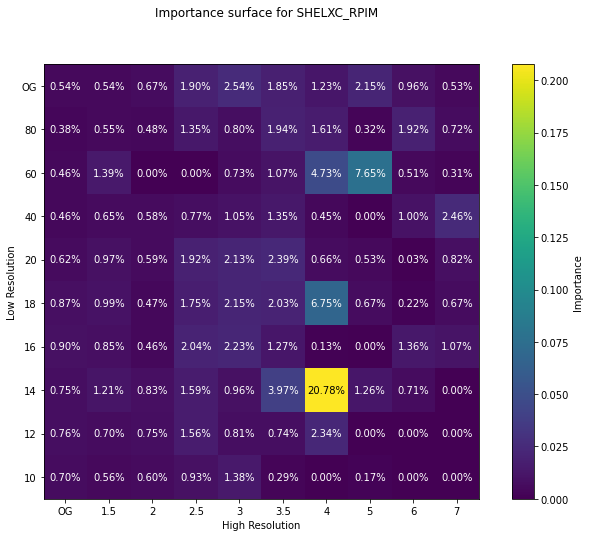

SHELXC_RANOM


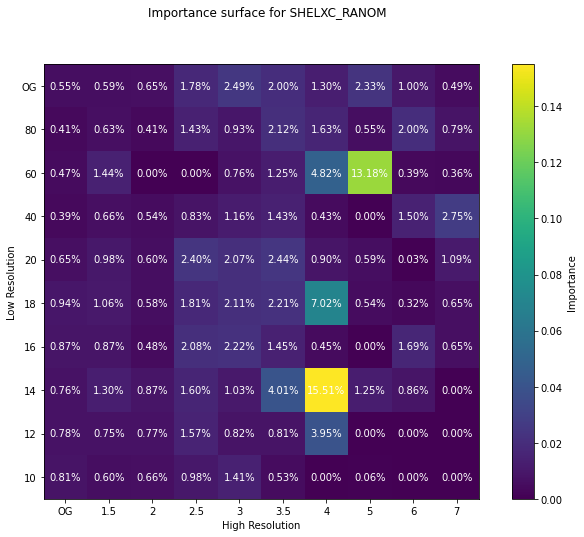

SHELXC_SIGNAL


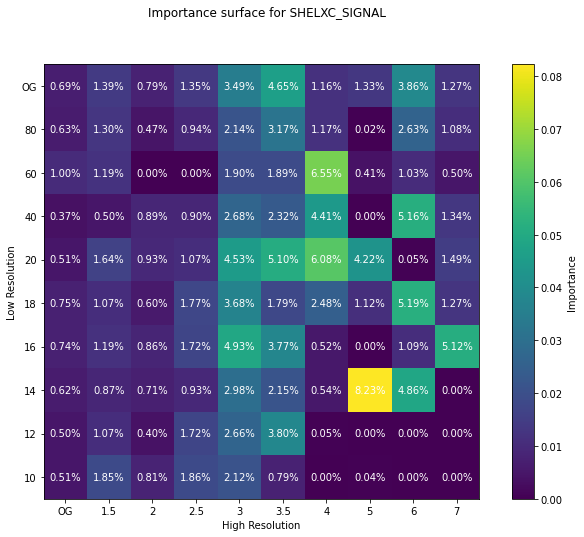

SOLVENT_CONTENT


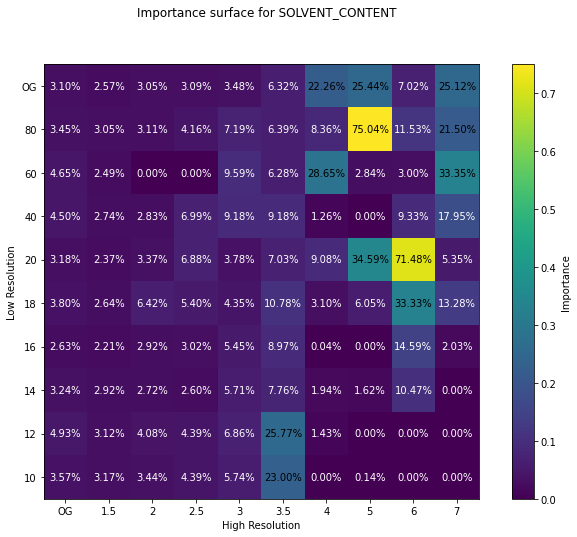

NUMBER_SITES


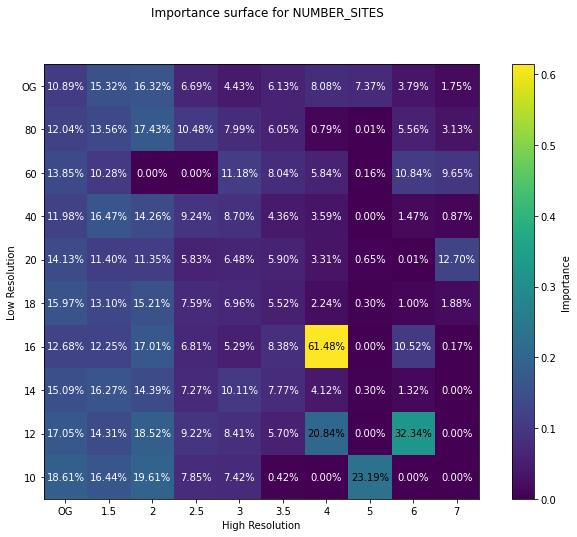

TOT_MOLWEIGHT


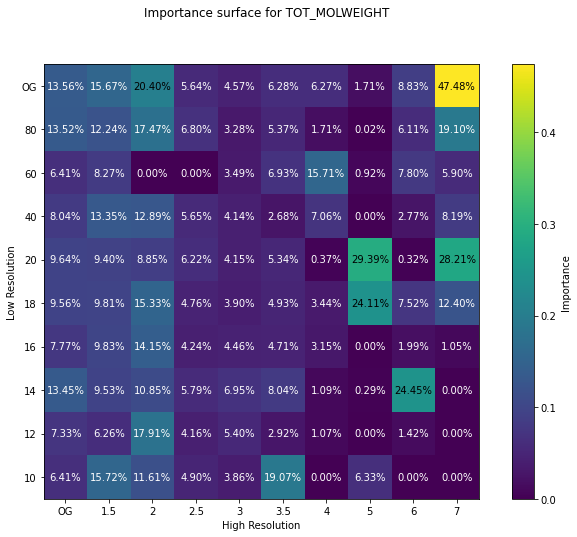

------------------------------------------------------------


In [4]:
for db_kind in ["dials", "3dii"]:
    print(db_kind.upper())
    
    # get every feature importances
    topfeats, cols = [], None
    for i in range(1, 101):
        db_dir = fr"D:\Diamond\analysis\results\dataset_{i}\{db_kind}"
        try:
            topfeat = pd.read_csv(os.path.join(db_dir, "topfeat.csv"), squeeze=True, index_col=0)
            topfeats.append(topfeat.to_list())
        except FileNotFoundError:
            topfeats.append(np.zeros_like(topfeats[-1]))
            
        # store feature names
        cols = topfeat.index if cols is None else cols
    
    # store in dataframe
    topfeats = pd.DataFrame(topfeats, columns=cols, index=range(1, 101))
    
    # for every feature/column
    for feat in topfeats:
        print(feat)
        fig = plt.figure(figsize=(12, 8))
        
        # get relevant data and reshape
        arr = topfeats[feat].values.reshape((10, 10))
        xx, yy = np.meshgrid(np.arange(len(highs)), np.arange(len(lows)))

        if plot_kind == "surface":
            # plot 3d surface
            ax = fig.add_subplot(projection="3d")
            img = ax.plot_surface(xx, yy, arr, cmap="viridis")
            ax.set_title(f"Importance surface for {feat}")
        
        elif plot_kind == "heatmap":
            # plot heatmap
            ax = fig.add_subplot()
            img = ax.imshow(arr)
            ax.grid(False)
            fig.suptitle(f"Importance surface for {feat}")
            
            # annotate heatmap
            for k in range(len(highs)):
                for j in range(len(lows)):
                    num = arr[k, j]
                    c = "k" if num > 0.2 else "w"
                    plt.text(j, k, f"{num:.2%}", ha="center", va="center", color=c)


        # colorbar
        fig.colorbar(img, label="Importance", ax=ax)

        # labels
        ax.set_xticks(range(len(highs)))
        ax.set_xticklabels(highs)
        ax.set_xlabel("High Resolution")
        ax.set_yticks(range(len(lows)))
        ax.set_yticklabels(lows)
        ax.set_ylabel("Low Resolution")

        plt.savefig(fr"C:\Users\César\PycharmProjects\Diamond_ML\figures\feature_importances\{feat}_{db_kind}")
        plt.show()
        
    
    print("-"*60)

An interesting thing to note here is that there are many cases of **random spikes** in importance, especially in the low HR region.

In this region, there is a **severe class imbalance**. There are actually regions with only 1 or 2 success cases, and as such the feature importance spike should not be considered, since that is just the model trying to predict something with unpredictable (aka very bad) data.